In [1]:
import tensorflow as tf
import tensorflow.keras as keras
from keras.models import Sequential, Model
from keras.layers import Dense, Input, Flatten, Reshape
from keras.datasets import mnist
from keras.optimizers import Adam,SGD
from keras.initializers import RandomNormal
from keras import losses
import numpy as np
import matplotlib.pyplot as plt
import keras.backend as K
import random

C:\Users\sudha\python3.6\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [14]:
initializer = RandomNormal(mean=0.0, stddev=0.01, seed=None)
#Initializing the parameters for Running the Model
epochs=6000
e_h_1=1000
e_h_2=1000
encoded_dim=8
d_h_1=1000
d_h_2=1000
disc_h_1=1000
disc_h_2=1000
img_shape=(28,28,1)
optimizer_reconst=Adam(0.0001)
optimizer_discriminator=Adam(0.00008)
optimizer_encoder_discriminator=Adam(0.00006)
#lr=0.0037 ideal lr Very Important On my machine



# Loading The Data

In [3]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train=x_train.reshape(x_train.shape[0],28,28,1).astype(np.float32)
x_train = x_train.astype(np.float32) / 255.
x_test=x_test.reshape(x_test.shape[0],28,28,1).astype(np.float32)
x_test = x_test.astype(np.float32) / 255.

# Preparing The DataSet

In [5]:
data_train=dict()
data_train_label=dict()
data_test=dict()
data_test_label=dict()

for i in range(10):
    data_train[str(i)]=[]
    data_train_label[str(i)]=[]
    data_test[str(i)]=[]
    data_test_label[str(i)]=[]
for i in range(y_train.shape[0]):
    val=y_train[i]
    data_train[str(val)].append(x_train[i])
    data_train_label[str(val)].append(y_train[i])
for i in range(y_test.shape[0]):
    val=y_test[i]
    data_test[str(val)].append(x_test[i])
    data_test_label[str(val)].append(y_test[i])


In [6]:
#Defining the Reconstruction Error Function
def err(a,b):
    a=np.array(a,dtype=np.float32)
    size=np.shape(a)
    err=a-b
    mse=err*err
    l=np.shape(size)
    l=l[0]
    for _ in range(l):
        mse=np.sum(mse)
    mse=mse/np.prod(size)
    return mse

In [6]:
#preparing the dataset, i.e. , Putting the separating the known and unknown
def prep(kno,unk):
    known_train=list()
    known_train_labels=list()
    unknown_train=list()
    unknown_train_labels=list()
    known_test=list()
    known_test_labels=list()
    unknown_test=list()
    unknown_test_labels=list()
    for i in kno:
        known_train=known_train+data_train[str(i)]
        known_train_labels=known_train_labels+data_train_label[str(i)]
        known_test=known_test+data_test[str(i)]
        known_test_labels=known_test_labels+data_test_label[str(i)]
    for i in unk:
        unknown_train=unknown_train+data_train[str(i)]
        unknown_train_labels=unknown_train_labels+data_train_label[str(i)]
        unknown_test=unknown_test+data_test[str(i)]
        unknown_test_labels=unknown_test_labels+data_test_label[str(i)]
    
    shl=list(zip(known_train,known_train_labels))
    random.shuffle(shl)
    known_train,known_train_labels=zip(*shl)
    
    shl=list(zip(known_test,known_test_labels))
    random.shuffle(shl)
    known_test,known_test_labels=zip(*shl)
    
    shl=list(zip(unknown_train,unknown_train_labels))
    random.shuffle(shl)
    unknown_train,unknown_train_labels=zip(*shl)
    
    shl=list(zip(unknown_test,unknown_test_labels))
    random.shuffle(shl)
    unknown_test,unknown_test_labels=zip(*shl)
    
    known_train=np.array(known_train)
    known_train_labels=np.array(known_train_labels)
    unknown_train=np.array(unknown_train)
    unknown_train_labels=np.array(unknown_train_labels)
    known_test=np.array(known_test)
    known_test_labels=np.array(known_test_labels)
    unknown_test=np.array(unknown_test)
    unknown_test_labels=np.array(unknown_test_labels)
    return known_train,known_train_labels,known_test,known_test_labels,unknown_train,unknown_train_labels,unknown_test,unknown_test_labels



In [7]:
#Just a testing code to check prep
kno=[0,7]
unk=[1,2,3,4,5,6,8,9]     
known_train,known_train_labels,known_test,known_test_labels,unknown_train,unknown_train_labels,unknown_test,unknown_test_labels=prep(kno,unk)

In [15]:
#for i in range(2,10):
#input the known digits in kno and the unknown digits in unk
kno=[0,3,7,9]
unk=[1,2,4,5,6,8]
#del unk[i-1]
known_train,known_train_labels,known_test,known_test_labels,unknown_train,unknown_train_labels,unknown_test,unknown_test_labels=prep(kno,unk)
# Defining The Model

##Encoder model

x_input=Input(img_shape)
flatten_layer=Flatten(input_shape=img_shape)(x_input)
encoder_hidden_1=Dense(e_h_1,activation='relu',kernel_initializer=initializer,
                       bias_initializer=initializer)(flatten_layer)
encoder_hidden_2=Dense(e_h_2,activation='relu',kernel_initializer=initializer,
                       bias_initializer=initializer)(encoder_hidden_1)
z_code=Dense(encoded_dim,activation='linear',kernel_initializer=initializer,
                       bias_initializer=initializer)(encoder_hidden_2)
encoder=Model(inputs=x_input,outputs=z_code)



##Decoder model


d_x_input=Input((encoded_dim,))
decoder_hidden_1=Dense(d_h_1,activation='relu',kernel_initializer=initializer,
                       bias_initializer=initializer)(d_x_input)
decoder_hidden_2=Dense(d_h_2,activation='relu',kernel_initializer=initializer,
                       bias_initializer=initializer)(decoder_hidden_1)
decoder_image=Dense(np.prod(img_shape),activation='sigmoid',kernel_initializer=initializer,
                       bias_initializer=initializer)(decoder_hidden_2)
gen_img=Reshape(img_shape)(decoder_image)

decoder=Model(inputs=d_x_input,outputs=gen_img)

#Discriminator


disc_x_input=Input((encoded_dim,))
disc_hidden_1=Dense(disc_h_1,activation='relu',kernel_initializer=initializer,
                       bias_initializer=initializer)(disc_x_input)
disc_hidden_2=Dense(disc_h_2,activation='relu',kernel_initializer=initializer,
                       bias_initializer=initializer)(disc_hidden_1)
real_or_fake=Dense(1,activation='sigmoid',kernel_initializer=initializer,
                       bias_initializer=initializer)(disc_hidden_2)
discriminator=Model(inputs=disc_x_input,outputs=real_or_fake)





##AutoEncoder

img=Input(shape=img_shape)
encoded_repr=encoder(img)
recons_img=decoder(encoded_repr)
AutoEncoder=Model(inputs=img,outputs=recons_img)


##encoder_discriminator


img1=Input(shape=img_shape)
encoded_repr=encoder(img1)
confidence=discriminator(encoded_repr)
Encoder_Discriminator=Model(inputs=img1,outputs=confidence)


AutoEncoder.compile(optimizer=optimizer_reconst,
                    loss='mse',metrics=['mse'])
discriminator.compile(optimizer=optimizer_discriminator,
                    loss='binary_crossentropy',
                    metrics=['accuracy'])
for layer in discriminator.layers:
    layer.trainable=False
Encoder_Discriminator.compile(optimizer=optimizer_encoder_discriminator,
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

# Training the Model

##Training
batch_size=200
d_err=[]
recons=[]
g_e_err=[]

for epoch in range(epochs):
    half_batch=int(batch_size/2)
    idx = np.random.randint(0, known_train.shape[0], half_batch)
    imgs=known_train[idx]
    latent_fake=encoder.predict(imgs)
    latent_real= np.random.normal(size=(half_batch, encoded_dim))
    valid =0.9*np.ones((half_batch, 1))
    fake = np.zeros((half_batch, 1))
    d_loss_real = discriminator.train_on_batch(latent_real, valid)
    d_loss_fake = discriminator.train_on_batch(latent_fake, fake)
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
    d_err.append(d_loss)
    #idx = np.random.randint(0, x_train.shape[0], batch_size)
    #imgs = x_train[idx]
    valid_y = 0.9*np.ones((half_batch, 1))
    g_loss_reconstruction = AutoEncoder.train_on_batch(imgs, imgs)
    recons.append(g_loss_reconstruction)
    #for i in range(5):
    g_loss_similarity = Encoder_Discriminator.train_on_batch(imgs, valid_y)
    g_e_err.append(g_loss_similarity)
    #print(g_loss_similarity)
    #print(g_loss_reconstruction)
    #quit()
    AutoEncoder.save_weights('AAE_AE_weights.h5')
    discriminator.save_weights('AAE_Disc_weights.h5')
    Encoder_Discriminator.save_weights('AAE_ED_weights.h5')
    print ("%d [D loss: %f, acc: %.2f%%] [G bce: %f,acc: %f, mse: %f]" % (epoch, d_loss[0], 100*d_loss[1],
           g_loss_similarity[0], g_loss_similarity[1], g_loss_reconstruction[1]))
    #print ("%d [ mse: %f]" % (epoch, g_loss_reconstruction[1]))
#AutoEncoder.fit(x=x_train,y=x_train, epochs=15)
AutoEncoder.save_weights("Known"+str(kno)+"_AAE_AE_weights.h5")
discriminator.save_weights("Known"+str(kno)+"_AAE_Disc_weights.h5")
Encoder_Discriminator.save_weights("Known"+str(kno)+"_AAE_ED_weights.h5")


#AutoEncoder.save_weights('AAE_AE_weights.h5')
#discriminator.save_weights('AAE_Disc_weights.h5')
#Encoder_Discriminator.save_weights('AAE_ED_weights.h5')

#Calculating and Saving The errors
#Uncomment the below code to save the errors for each test and train data
"""
train_error_kn=[]
train_derr_kn=[]
test_derr_kn=[]
test_error_kn=[]
test_error_unk=[]
test_error_per=dict()
train_error_per=dict()
train_derr_per=dict()
test_derr_per=dict()
for i in range(10):
    test_error_per[str(i)]=[]
    train_error_per[str(i)]=[]
    train_derr_per[str(i)]=[]
    test_derr_per[str(i)]=[]
for i in range(known_train.shape[0]):
    img=known_train[i].reshape(1,28,28,1)
    error,_=AutoEncoder.evaluate(img,img)
    encd=encoder.predict(img)
    derr,_=discriminator.evaluate(encd,[0])
    idx=known_train_labels[i]
    train_error_per[str(idx)].append(error)
    train_derr_per[str(idx)].append(derr)
    train_error_kn.append(error)
    train_derr_kn.append(derr)
for i in range(known_test.shape[0]):
    img=known_test[i].reshape(1,28,28,1)
    error,_=AutoEncoder.evaluate(img,img)
    idx=known_test_labels[i]
    encd=encoder.predict(img)
    derr,_=discriminator.evaluate(encd,[0])
    test_error_per[str(idx)].append(error)
    test_derr_per[str(idx)].append(derr)
    test_error_kn.append(error)
    test_derr_kn.append(derr)
for i in range(unknown_train_labels.shape[0]):
    idx=unknown_train_labels[i]
    img=unknown_train[i].reshape(1,28,28,1)
    error,_=AutoEncoder.evaluate(img,img)
    encd=encoder.predict(img)
    derr,_=discriminator.evaluate(encd,[0])
    test_error_per[str(idx)].append(error)
    test_error_unk.append(error)
    test_derr_per[str(idx)].append(derr)
for i in range(unknown_test_labels.shape[0]):
    img=unknown_test[i].reshape(1,28,28,1)
    idx=unknown_test_labels[i]
    error=AutoEncoder.evaluate(img,img)
    encd=encoder.predict(img)
    derr,_=discriminator.evaluate(encd,[0])
    test_error_per[str(idx)].append(error)
    test_error_unk.append(error)
    test_derr_per[str(idx)].append(derr)


#Saving The Errors To A File

file=open("Known"+str(kno)+"train_error_kn.txt","w")
for error in train_error_kn:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"train_derr_kn.txt","w")
for error in train_derr_kn:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"test_derr_kn.txt","w")
for error in test_derr_kn:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"test_error_kn.txt","w")
for error in test_error_kn:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"test_error_unk.txt","w")
for error in test_error_unk:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"d_err.txt","w")
for error in d_err:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"g_e_err.txt","w")
for error in g_e_err:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"recons.txt","w")
for error in recons:
    file.write(str(error)+" ")
file.close()
np.save("Known"+str(kno)+"test_error_per.npy",test_error_per)
np.save("Known"+str(kno)+"train_error_per.npy",train_error_per)
np.save("Known"+str(kno)+"train_derr_per.npy",train_derr_per)
np.save("Known"+str(kno)+"test_derr_per.npy",test_derr_per)

"""

C:\Users\sudha\python3.6\lib\site-packages\keras\engine\training.py:973: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.693318, acc: 0.00%] [G bce: 0.692789,acc: 0.000000, mse: 0.230803]
1 [D loss: 0.692575, acc: 0.00%] [G bce: 0.692649,acc: 0.000000, mse: 0.230784]
2 [D loss: 0.691979, acc: 0.00%] [G bce: 0.692592,acc: 0.000000, mse: 0.230732]
3 [D loss: 0.691335, acc: 0.00%] [G bce: 0.692571,acc: 0.000000, mse: 0.230299]
4 [D loss: 0.690532, acc: 0.00%] [G bce: 0.692569,acc: 0.000000, mse: 0.230758]
5 [D loss: 0.689850, acc: 0.00%] [G bce: 0.692570,acc: 0.000000, mse: 0.230730]
6 [D loss: 0.688958, acc: 0.00%] [G bce: 0.692582,acc: 0.000000, mse: 0.229653]
7 [D loss: 0.688738, acc: 0.00%] [G bce: 0.692592,acc: 0.000000, mse: 0.229816]
8 [D loss: 0.687786, acc: 0.00%] [G bce: 0.692615,acc: 0.000000, mse: 0.230258]
9 [D loss: 0.687155, acc: 0.00%] [G bce: 0.692644,acc: 0.000000, mse: 0.230104]
10 [D loss: 0.686553, acc: 0.00%] [G bce: 0.692687,acc: 0.000000, mse: 0.229247]
11 [D loss: 0.685265, acc: 0.00%] [G bce: 0.692729,acc: 0.000000, mse: 0.229910]
12 [D loss: 0.684435, acc: 0.00%] [G b

102 [D loss: 0.211498, acc: 50.00%] [G bce: 2.721707,acc: 0.000000, mse: 0.071632]
103 [D loss: 0.208058, acc: 50.00%] [G bce: 2.724551,acc: 0.000000, mse: 0.070695]
104 [D loss: 0.213306, acc: 50.00%] [G bce: 2.669624,acc: 0.000000, mse: 0.072107]
105 [D loss: 0.216150, acc: 50.00%] [G bce: 2.556846,acc: 0.000000, mse: 0.070709]
106 [D loss: 0.209258, acc: 50.00%] [G bce: 2.676401,acc: 0.000000, mse: 0.070682]
107 [D loss: 0.213847, acc: 50.00%] [G bce: 2.607016,acc: 0.000000, mse: 0.070121]
108 [D loss: 0.217245, acc: 50.00%] [G bce: 2.555906,acc: 0.000000, mse: 0.069771]
109 [D loss: 0.218126, acc: 50.00%] [G bce: 2.597353,acc: 0.000000, mse: 0.070812]
110 [D loss: 0.215317, acc: 50.00%] [G bce: 2.603158,acc: 0.000000, mse: 0.069127]
111 [D loss: 0.212027, acc: 50.00%] [G bce: 2.716483,acc: 0.000000, mse: 0.069510]
112 [D loss: 0.212161, acc: 50.00%] [G bce: 2.606822,acc: 0.000000, mse: 0.071169]
113 [D loss: 0.216621, acc: 50.00%] [G bce: 2.645126,acc: 0.000000, mse: 0.070192]
114 

201 [D loss: 0.235755, acc: 50.00%] [G bce: 2.295936,acc: 0.000000, mse: 0.068209]
202 [D loss: 0.239412, acc: 50.00%] [G bce: 2.288908,acc: 0.000000, mse: 0.071961]
203 [D loss: 0.246018, acc: 50.00%] [G bce: 2.254701,acc: 0.000000, mse: 0.069038]
204 [D loss: 0.241022, acc: 50.00%] [G bce: 2.286577,acc: 0.000000, mse: 0.069477]
205 [D loss: 0.256781, acc: 50.00%] [G bce: 2.217643,acc: 0.000000, mse: 0.069911]
206 [D loss: 0.239689, acc: 50.00%] [G bce: 2.301779,acc: 0.000000, mse: 0.067349]
207 [D loss: 0.259150, acc: 50.00%] [G bce: 2.292064,acc: 0.000000, mse: 0.070338]
208 [D loss: 0.244541, acc: 50.00%] [G bce: 2.335533,acc: 0.000000, mse: 0.067417]
209 [D loss: 0.255440, acc: 50.00%] [G bce: 2.295668,acc: 0.000000, mse: 0.068112]
210 [D loss: 0.233571, acc: 50.00%] [G bce: 2.321790,acc: 0.000000, mse: 0.067584]
211 [D loss: 0.247508, acc: 50.00%] [G bce: 2.325332,acc: 0.000000, mse: 0.069026]
212 [D loss: 0.241869, acc: 50.00%] [G bce: 2.348541,acc: 0.000000, mse: 0.065499]
213 

302 [D loss: 0.213149, acc: 50.00%] [G bce: 3.146948,acc: 0.000000, mse: 0.066770]
303 [D loss: 0.214253, acc: 50.00%] [G bce: 3.293507,acc: 0.000000, mse: 0.063478]
304 [D loss: 0.211300, acc: 50.00%] [G bce: 3.170857,acc: 0.000000, mse: 0.068658]
305 [D loss: 0.215181, acc: 50.00%] [G bce: 3.159837,acc: 0.000000, mse: 0.063393]
306 [D loss: 0.223558, acc: 50.00%] [G bce: 3.044496,acc: 0.000000, mse: 0.066606]
307 [D loss: 0.225794, acc: 50.00%] [G bce: 2.967068,acc: 0.000000, mse: 0.069501]
308 [D loss: 0.210942, acc: 50.00%] [G bce: 3.197524,acc: 0.000000, mse: 0.063766]
309 [D loss: 0.205872, acc: 50.00%] [G bce: 3.281960,acc: 0.000000, mse: 0.062448]
310 [D loss: 0.210529, acc: 50.00%] [G bce: 3.184871,acc: 0.000000, mse: 0.066244]
311 [D loss: 0.221678, acc: 50.00%] [G bce: 3.187218,acc: 0.000000, mse: 0.065091]
312 [D loss: 0.226267, acc: 50.00%] [G bce: 3.031868,acc: 0.000000, mse: 0.067561]
313 [D loss: 0.219241, acc: 50.00%] [G bce: 2.983251,acc: 0.000000, mse: 0.067509]
314 

403 [D loss: 0.248941, acc: 50.00%] [G bce: 3.432377,acc: 0.000000, mse: 0.057926]
404 [D loss: 0.248657, acc: 50.00%] [G bce: 3.434726,acc: 0.000000, mse: 0.064058]
405 [D loss: 0.216723, acc: 50.00%] [G bce: 3.276858,acc: 0.000000, mse: 0.058349]
406 [D loss: 0.231678, acc: 50.00%] [G bce: 3.178978,acc: 0.000000, mse: 0.061546]
407 [D loss: 0.215386, acc: 50.00%] [G bce: 3.097990,acc: 0.000000, mse: 0.056946]
408 [D loss: 0.255606, acc: 50.00%] [G bce: 3.052300,acc: 0.000000, mse: 0.061135]
409 [D loss: 0.214753, acc: 50.00%] [G bce: 3.101838,acc: 0.000000, mse: 0.059373]
410 [D loss: 0.228174, acc: 50.00%] [G bce: 3.096918,acc: 0.000000, mse: 0.060958]
411 [D loss: 0.219834, acc: 50.00%] [G bce: 3.107260,acc: 0.000000, mse: 0.053857]
412 [D loss: 0.224191, acc: 50.00%] [G bce: 3.171899,acc: 0.000000, mse: 0.056796]
413 [D loss: 0.220155, acc: 50.00%] [G bce: 3.139831,acc: 0.000000, mse: 0.060408]
414 [D loss: 0.230226, acc: 50.00%] [G bce: 3.028203,acc: 0.000000, mse: 0.058250]
415 

504 [D loss: 0.336408, acc: 50.00%] [G bce: 2.660221,acc: 0.000000, mse: 0.056192]
505 [D loss: 0.277064, acc: 50.00%] [G bce: 2.891283,acc: 0.000000, mse: 0.054068]
506 [D loss: 0.293880, acc: 50.00%] [G bce: 2.548118,acc: 0.000000, mse: 0.059129]
507 [D loss: 0.299241, acc: 50.00%] [G bce: 2.627806,acc: 0.000000, mse: 0.056623]
508 [D loss: 0.265272, acc: 50.00%] [G bce: 2.637790,acc: 0.000000, mse: 0.053763]
509 [D loss: 0.313764, acc: 50.00%] [G bce: 2.492551,acc: 0.000000, mse: 0.055535]
510 [D loss: 0.272479, acc: 50.00%] [G bce: 2.562533,acc: 0.000000, mse: 0.051400]
511 [D loss: 0.242540, acc: 50.00%] [G bce: 2.645022,acc: 0.000000, mse: 0.056807]
512 [D loss: 0.282860, acc: 50.00%] [G bce: 2.457566,acc: 0.000000, mse: 0.057606]
513 [D loss: 0.287757, acc: 50.00%] [G bce: 2.434981,acc: 0.000000, mse: 0.054237]
514 [D loss: 0.248836, acc: 50.00%] [G bce: 2.533053,acc: 0.000000, mse: 0.057085]
515 [D loss: 0.253048, acc: 50.00%] [G bce: 2.642040,acc: 0.000000, mse: 0.054813]
516 

604 [D loss: 0.304334, acc: 50.00%] [G bce: 2.122544,acc: 0.000000, mse: 0.054115]
605 [D loss: 0.361720, acc: 50.00%] [G bce: 2.107407,acc: 0.000000, mse: 0.054476]
606 [D loss: 0.361077, acc: 50.00%] [G bce: 2.141304,acc: 0.000000, mse: 0.053084]
607 [D loss: 0.329496, acc: 50.00%] [G bce: 2.094080,acc: 0.000000, mse: 0.054552]
608 [D loss: 0.328439, acc: 50.00%] [G bce: 2.156962,acc: 0.000000, mse: 0.050886]
609 [D loss: 0.353385, acc: 50.00%] [G bce: 2.207916,acc: 0.000000, mse: 0.052834]
610 [D loss: 0.454456, acc: 50.00%] [G bce: 1.985081,acc: 0.000000, mse: 0.053931]
611 [D loss: 0.353225, acc: 50.00%] [G bce: 2.060642,acc: 0.000000, mse: 0.052532]
612 [D loss: 0.359359, acc: 50.00%] [G bce: 2.103585,acc: 0.000000, mse: 0.050466]
613 [D loss: 0.372710, acc: 50.00%] [G bce: 2.016068,acc: 0.000000, mse: 0.054090]
614 [D loss: 0.409458, acc: 50.00%] [G bce: 2.076573,acc: 0.000000, mse: 0.052586]
615 [D loss: 0.387731, acc: 50.00%] [G bce: 2.022440,acc: 0.000000, mse: 0.051426]
616 

703 [D loss: 0.424491, acc: 50.00%] [G bce: 2.269757,acc: 0.000000, mse: 0.049406]
704 [D loss: 0.362913, acc: 50.00%] [G bce: 2.150051,acc: 0.000000, mse: 0.051534]
705 [D loss: 0.370581, acc: 50.00%] [G bce: 2.158018,acc: 0.000000, mse: 0.050801]
706 [D loss: 0.338116, acc: 50.00%] [G bce: 2.163625,acc: 0.000000, mse: 0.049486]
707 [D loss: 0.351139, acc: 50.00%] [G bce: 2.112686,acc: 0.000000, mse: 0.051933]
708 [D loss: 0.325249, acc: 50.00%] [G bce: 2.187650,acc: 0.000000, mse: 0.049852]
709 [D loss: 0.347897, acc: 50.00%] [G bce: 2.132949,acc: 0.000000, mse: 0.052421]
710 [D loss: 0.368640, acc: 50.00%] [G bce: 2.225738,acc: 0.000000, mse: 0.051106]
711 [D loss: 0.395185, acc: 50.00%] [G bce: 2.214828,acc: 0.000000, mse: 0.051054]
712 [D loss: 0.327078, acc: 50.00%] [G bce: 2.197782,acc: 0.000000, mse: 0.049311]
713 [D loss: 0.399938, acc: 50.00%] [G bce: 2.167919,acc: 0.000000, mse: 0.051834]
714 [D loss: 0.383794, acc: 50.00%] [G bce: 2.231245,acc: 0.000000, mse: 0.050944]
715 

802 [D loss: 0.405563, acc: 50.00%] [G bce: 2.019789,acc: 0.000000, mse: 0.049707]
803 [D loss: 0.367120, acc: 50.00%] [G bce: 2.007779,acc: 0.000000, mse: 0.047925]
804 [D loss: 0.380942, acc: 50.00%] [G bce: 2.014033,acc: 0.000000, mse: 0.048398]
805 [D loss: 0.388629, acc: 50.00%] [G bce: 2.000097,acc: 0.000000, mse: 0.049433]
806 [D loss: 0.366310, acc: 50.00%] [G bce: 1.958892,acc: 0.000000, mse: 0.049474]
807 [D loss: 0.416979, acc: 50.00%] [G bce: 1.948655,acc: 0.000000, mse: 0.049454]
808 [D loss: 0.368518, acc: 50.00%] [G bce: 2.011282,acc: 0.000000, mse: 0.047753]
809 [D loss: 0.409534, acc: 50.00%] [G bce: 2.103048,acc: 0.000000, mse: 0.048249]
810 [D loss: 0.417406, acc: 50.00%] [G bce: 1.877358,acc: 0.000000, mse: 0.049911]
811 [D loss: 0.337247, acc: 50.00%] [G bce: 1.987177,acc: 0.000000, mse: 0.048891]
812 [D loss: 0.424371, acc: 50.00%] [G bce: 1.780835,acc: 0.000000, mse: 0.052227]
813 [D loss: 0.377314, acc: 50.00%] [G bce: 2.107962,acc: 0.000000, mse: 0.047076]
814 

903 [D loss: 0.349939, acc: 50.00%] [G bce: 1.864190,acc: 0.000000, mse: 0.047127]
904 [D loss: 0.399368, acc: 50.00%] [G bce: 1.823624,acc: 0.000000, mse: 0.049262]
905 [D loss: 0.399673, acc: 50.00%] [G bce: 1.793766,acc: 0.000000, mse: 0.046766]
906 [D loss: 0.354287, acc: 50.00%] [G bce: 1.852394,acc: 0.000000, mse: 0.048049]
907 [D loss: 0.374166, acc: 50.00%] [G bce: 1.796311,acc: 0.000000, mse: 0.047867]
908 [D loss: 0.373733, acc: 50.00%] [G bce: 1.914574,acc: 0.000000, mse: 0.047227]
909 [D loss: 0.387195, acc: 50.00%] [G bce: 1.784178,acc: 0.000000, mse: 0.049118]
910 [D loss: 0.378065, acc: 50.00%] [G bce: 1.918976,acc: 0.000000, mse: 0.045629]
911 [D loss: 0.388915, acc: 50.00%] [G bce: 1.754592,acc: 0.000000, mse: 0.049817]
912 [D loss: 0.401351, acc: 50.00%] [G bce: 1.858098,acc: 0.000000, mse: 0.047990]
913 [D loss: 0.445611, acc: 50.00%] [G bce: 1.886092,acc: 0.000000, mse: 0.047450]
914 [D loss: 0.422819, acc: 50.00%] [G bce: 1.858715,acc: 0.000000, mse: 0.047555]
915 

1002 [D loss: 0.341583, acc: 49.00%] [G bce: 2.132307,acc: 0.000000, mse: 0.044440]
1003 [D loss: 0.470139, acc: 49.00%] [G bce: 1.833040,acc: 0.000000, mse: 0.047203]
1004 [D loss: 0.445903, acc: 49.50%] [G bce: 2.131138,acc: 0.000000, mse: 0.046358]
1005 [D loss: 0.424468, acc: 49.00%] [G bce: 2.161023,acc: 0.000000, mse: 0.047467]
1006 [D loss: 0.475065, acc: 49.00%] [G bce: 2.098650,acc: 0.000000, mse: 0.046270]
1007 [D loss: 0.463151, acc: 49.50%] [G bce: 2.129291,acc: 0.000000, mse: 0.045329]
1008 [D loss: 0.416281, acc: 49.00%] [G bce: 2.084538,acc: 0.000000, mse: 0.046383]
1009 [D loss: 0.473333, acc: 49.00%] [G bce: 1.924741,acc: 0.000000, mse: 0.045741]
1010 [D loss: 0.477668, acc: 49.50%] [G bce: 2.038851,acc: 0.000000, mse: 0.045123]
1011 [D loss: 0.424164, acc: 49.00%] [G bce: 2.031633,acc: 0.000000, mse: 0.046566]
1012 [D loss: 0.407980, acc: 48.50%] [G bce: 1.907252,acc: 0.000000, mse: 0.045610]
1013 [D loss: 0.475060, acc: 47.50%] [G bce: 1.856798,acc: 0.000000, mse: 0.

1100 [D loss: 0.459201, acc: 43.00%] [G bce: 2.147440,acc: 0.000000, mse: 0.043427]
1101 [D loss: 0.502842, acc: 44.00%] [G bce: 2.651983,acc: 0.000000, mse: 0.040696]
1102 [D loss: 0.574533, acc: 41.00%] [G bce: 2.319168,acc: 0.000000, mse: 0.041509]
1103 [D loss: 0.564347, acc: 44.00%] [G bce: 2.272391,acc: 0.000000, mse: 0.042355]
1104 [D loss: 0.513235, acc: 42.00%] [G bce: 2.369183,acc: 0.000000, mse: 0.042067]
1105 [D loss: 0.574459, acc: 39.50%] [G bce: 2.007307,acc: 0.000000, mse: 0.044471]
1106 [D loss: 0.522108, acc: 45.00%] [G bce: 2.613095,acc: 0.000000, mse: 0.039035]
1107 [D loss: 0.487658, acc: 45.00%] [G bce: 2.358164,acc: 0.000000, mse: 0.040336]
1108 [D loss: 0.487494, acc: 46.00%] [G bce: 2.670870,acc: 0.000000, mse: 0.040822]
1109 [D loss: 0.558619, acc: 44.00%] [G bce: 2.255271,acc: 0.000000, mse: 0.043245]
1110 [D loss: 0.442107, acc: 48.50%] [G bce: 2.473621,acc: 0.000000, mse: 0.042675]
1111 [D loss: 0.463622, acc: 47.50%] [G bce: 2.409053,acc: 0.000000, mse: 0.

1199 [D loss: 0.488231, acc: 47.00%] [G bce: 2.061695,acc: 0.000000, mse: 0.038717]
1200 [D loss: 0.511249, acc: 47.50%] [G bce: 1.898041,acc: 0.000000, mse: 0.041568]
1201 [D loss: 0.527584, acc: 48.00%] [G bce: 2.029046,acc: 0.000000, mse: 0.039706]
1202 [D loss: 0.536502, acc: 47.00%] [G bce: 1.889070,acc: 0.000000, mse: 0.038468]
1203 [D loss: 0.517749, acc: 46.50%] [G bce: 1.898327,acc: 0.000000, mse: 0.040284]
1204 [D loss: 0.546950, acc: 47.50%] [G bce: 2.006712,acc: 0.000000, mse: 0.036484]
1205 [D loss: 0.476854, acc: 47.00%] [G bce: 1.933594,acc: 0.000000, mse: 0.040607]
1206 [D loss: 0.466853, acc: 45.50%] [G bce: 1.825907,acc: 0.000000, mse: 0.039449]
1207 [D loss: 0.551602, acc: 47.00%] [G bce: 1.711996,acc: 0.000000, mse: 0.040396]
1208 [D loss: 0.584885, acc: 46.00%] [G bce: 1.932550,acc: 0.000000, mse: 0.038036]
1209 [D loss: 0.572164, acc: 46.50%] [G bce: 1.809535,acc: 0.000000, mse: 0.038645]
1210 [D loss: 0.480029, acc: 45.50%] [G bce: 1.712059,acc: 0.000000, mse: 0.

1298 [D loss: 0.625573, acc: 45.00%] [G bce: 1.563677,acc: 0.000000, mse: 0.036742]
1299 [D loss: 0.581672, acc: 44.00%] [G bce: 1.417906,acc: 0.000000, mse: 0.038248]
1300 [D loss: 0.550408, acc: 45.00%] [G bce: 1.465843,acc: 0.000000, mse: 0.037620]
1301 [D loss: 0.584404, acc: 47.50%] [G bce: 1.557613,acc: 0.000000, mse: 0.037266]
1302 [D loss: 0.540127, acc: 43.50%] [G bce: 1.475420,acc: 0.000000, mse: 0.039900]
1303 [D loss: 0.521947, acc: 47.00%] [G bce: 1.500710,acc: 0.000000, mse: 0.038871]
1304 [D loss: 0.556753, acc: 44.50%] [G bce: 1.578952,acc: 0.000000, mse: 0.038378]
1305 [D loss: 0.520135, acc: 44.50%] [G bce: 1.651167,acc: 0.000000, mse: 0.038102]
1306 [D loss: 0.604463, acc: 44.50%] [G bce: 1.501303,acc: 0.000000, mse: 0.037612]
1307 [D loss: 0.496151, acc: 47.00%] [G bce: 1.570027,acc: 0.000000, mse: 0.037814]
1308 [D loss: 0.536933, acc: 46.50%] [G bce: 1.602563,acc: 0.000000, mse: 0.039197]
1309 [D loss: 0.485923, acc: 47.00%] [G bce: 1.569084,acc: 0.000000, mse: 0.

1397 [D loss: 0.590749, acc: 39.00%] [G bce: 1.383811,acc: 0.000000, mse: 0.036611]
1398 [D loss: 0.543086, acc: 40.00%] [G bce: 1.315700,acc: 0.000000, mse: 0.038222]
1399 [D loss: 0.551874, acc: 42.50%] [G bce: 1.366134,acc: 0.000000, mse: 0.035384]
1400 [D loss: 0.554760, acc: 37.50%] [G bce: 1.397689,acc: 0.000000, mse: 0.035677]
1401 [D loss: 0.620425, acc: 32.50%] [G bce: 1.285800,acc: 0.000000, mse: 0.039232]
1402 [D loss: 0.613656, acc: 38.50%] [G bce: 1.339794,acc: 0.000000, mse: 0.037318]
1403 [D loss: 0.583532, acc: 40.00%] [G bce: 1.443854,acc: 0.000000, mse: 0.035429]
1404 [D loss: 0.650078, acc: 40.00%] [G bce: 1.374854,acc: 0.000000, mse: 0.038130]
1405 [D loss: 0.622982, acc: 39.50%] [G bce: 1.484668,acc: 0.000000, mse: 0.036139]
1406 [D loss: 0.634926, acc: 35.00%] [G bce: 1.376071,acc: 0.000000, mse: 0.037432]
1407 [D loss: 0.671381, acc: 39.50%] [G bce: 1.460994,acc: 0.000000, mse: 0.034544]
1408 [D loss: 0.751015, acc: 35.50%] [G bce: 1.364277,acc: 0.000000, mse: 0.

1496 [D loss: 0.620642, acc: 45.50%] [G bce: 1.886433,acc: 0.000000, mse: 0.036664]
1497 [D loss: 0.541254, acc: 47.00%] [G bce: 1.955137,acc: 0.000000, mse: 0.033439]
1498 [D loss: 0.548025, acc: 47.00%] [G bce: 2.076757,acc: 0.000000, mse: 0.033697]
1499 [D loss: 0.531315, acc: 48.50%] [G bce: 2.053283,acc: 0.000000, mse: 0.037010]
1500 [D loss: 0.485887, acc: 46.50%] [G bce: 1.992058,acc: 0.000000, mse: 0.035842]
1501 [D loss: 0.465005, acc: 49.00%] [G bce: 2.289318,acc: 0.000000, mse: 0.033474]
1502 [D loss: 0.474995, acc: 48.50%] [G bce: 2.084839,acc: 0.000000, mse: 0.035556]
1503 [D loss: 0.541138, acc: 48.00%] [G bce: 1.937750,acc: 0.000000, mse: 0.035864]
1504 [D loss: 0.460241, acc: 47.00%] [G bce: 2.035648,acc: 0.000000, mse: 0.037232]
1505 [D loss: 0.441974, acc: 50.00%] [G bce: 2.044522,acc: 0.000000, mse: 0.035781]
1506 [D loss: 0.484909, acc: 48.50%] [G bce: 2.017301,acc: 0.000000, mse: 0.036705]
1507 [D loss: 0.416123, acc: 49.00%] [G bce: 2.189271,acc: 0.000000, mse: 0.

1595 [D loss: 0.564059, acc: 40.50%] [G bce: 2.027224,acc: 0.000000, mse: 0.034595]
1596 [D loss: 0.585277, acc: 38.50%] [G bce: 1.832917,acc: 0.000000, mse: 0.035279]
1597 [D loss: 0.599187, acc: 40.00%] [G bce: 1.756675,acc: 0.000000, mse: 0.036330]
1598 [D loss: 0.560912, acc: 40.50%] [G bce: 1.851990,acc: 0.000000, mse: 0.034497]
1599 [D loss: 0.563886, acc: 40.00%] [G bce: 1.841162,acc: 0.000000, mse: 0.036288]
1600 [D loss: 0.569212, acc: 41.00%] [G bce: 1.925605,acc: 0.000000, mse: 0.033298]
1601 [D loss: 0.626693, acc: 37.50%] [G bce: 1.742348,acc: 0.000000, mse: 0.037213]
1602 [D loss: 0.554728, acc: 39.50%] [G bce: 1.797317,acc: 0.000000, mse: 0.035826]
1603 [D loss: 0.631019, acc: 40.50%] [G bce: 1.921530,acc: 0.000000, mse: 0.035261]
1604 [D loss: 0.612603, acc: 40.50%] [G bce: 2.034239,acc: 0.000000, mse: 0.033719]
1605 [D loss: 0.627873, acc: 39.50%] [G bce: 1.855422,acc: 0.000000, mse: 0.033654]
1606 [D loss: 0.654111, acc: 39.00%] [G bce: 1.717972,acc: 0.000000, mse: 0.

1694 [D loss: 0.520655, acc: 47.50%] [G bce: 1.966373,acc: 0.000000, mse: 0.036317]
1695 [D loss: 0.483639, acc: 48.00%] [G bce: 1.980354,acc: 0.000000, mse: 0.034681]
1696 [D loss: 0.479265, acc: 47.00%] [G bce: 2.162193,acc: 0.000000, mse: 0.034951]
1697 [D loss: 0.550329, acc: 47.50%] [G bce: 1.940018,acc: 0.000000, mse: 0.035830]
1698 [D loss: 0.501537, acc: 46.00%] [G bce: 1.896933,acc: 0.000000, mse: 0.034260]
1699 [D loss: 0.533583, acc: 48.50%] [G bce: 1.945666,acc: 0.000000, mse: 0.034130]
1700 [D loss: 0.532333, acc: 46.50%] [G bce: 1.907764,acc: 0.000000, mse: 0.033462]
1701 [D loss: 0.476639, acc: 47.50%] [G bce: 1.991335,acc: 0.000000, mse: 0.033892]
1702 [D loss: 0.532306, acc: 46.50%] [G bce: 2.100842,acc: 0.000000, mse: 0.033478]
1703 [D loss: 0.516204, acc: 46.50%] [G bce: 1.954888,acc: 0.000000, mse: 0.035151]
1704 [D loss: 0.485118, acc: 48.00%] [G bce: 1.839779,acc: 0.000000, mse: 0.034430]
1705 [D loss: 0.455375, acc: 48.50%] [G bce: 1.863704,acc: 0.000000, mse: 0.

1793 [D loss: 0.615917, acc: 37.50%] [G bce: 1.231237,acc: 0.000000, mse: 0.034855]
1794 [D loss: 0.627802, acc: 38.50%] [G bce: 1.271090,acc: 0.000000, mse: 0.035750]
1795 [D loss: 0.553229, acc: 42.00%] [G bce: 1.402021,acc: 0.000000, mse: 0.034119]
1796 [D loss: 0.569570, acc: 42.50%] [G bce: 1.429009,acc: 0.000000, mse: 0.032506]
1797 [D loss: 0.595918, acc: 40.00%] [G bce: 1.350598,acc: 0.000000, mse: 0.033146]
1798 [D loss: 0.589020, acc: 40.00%] [G bce: 1.286253,acc: 0.000000, mse: 0.033058]
1799 [D loss: 0.570237, acc: 42.00%] [G bce: 1.386558,acc: 0.000000, mse: 0.033431]
1800 [D loss: 0.599438, acc: 41.50%] [G bce: 1.245993,acc: 0.000000, mse: 0.033738]
1801 [D loss: 0.592625, acc: 40.00%] [G bce: 1.245835,acc: 0.000000, mse: 0.034475]
1802 [D loss: 0.601919, acc: 42.50%] [G bce: 1.299734,acc: 0.000000, mse: 0.033375]
1803 [D loss: 0.603904, acc: 39.50%] [G bce: 1.233572,acc: 0.000000, mse: 0.033788]
1804 [D loss: 0.587664, acc: 38.50%] [G bce: 1.223877,acc: 0.000000, mse: 0.

1892 [D loss: 0.633645, acc: 38.50%] [G bce: 1.501386,acc: 0.000000, mse: 0.032791]
1893 [D loss: 0.632655, acc: 40.00%] [G bce: 1.521342,acc: 0.000000, mse: 0.033342]
1894 [D loss: 0.673675, acc: 37.50%] [G bce: 1.418376,acc: 0.000000, mse: 0.033174]
1895 [D loss: 0.585421, acc: 35.50%] [G bce: 1.294862,acc: 0.000000, mse: 0.035428]
1896 [D loss: 0.590044, acc: 38.50%] [G bce: 1.436864,acc: 0.000000, mse: 0.031863]
1897 [D loss: 0.614688, acc: 36.00%] [G bce: 1.370921,acc: 0.000000, mse: 0.031926]
1898 [D loss: 0.759736, acc: 31.00%] [G bce: 1.188279,acc: 0.000000, mse: 0.035494]
1899 [D loss: 0.656677, acc: 35.00%] [G bce: 1.510233,acc: 0.000000, mse: 0.034573]
1900 [D loss: 0.623262, acc: 32.00%] [G bce: 1.286220,acc: 0.000000, mse: 0.036065]
1901 [D loss: 0.630004, acc: 35.00%] [G bce: 1.427325,acc: 0.000000, mse: 0.034816]
1902 [D loss: 0.590964, acc: 37.50%] [G bce: 1.395193,acc: 0.000000, mse: 0.034203]
1903 [D loss: 0.611886, acc: 37.50%] [G bce: 1.478626,acc: 0.000000, mse: 0.

1991 [D loss: 0.480779, acc: 45.00%] [G bce: 1.926873,acc: 0.000000, mse: 0.032667]
1992 [D loss: 0.522092, acc: 46.00%] [G bce: 1.751121,acc: 0.000000, mse: 0.032661]
1993 [D loss: 0.439338, acc: 48.00%] [G bce: 1.930747,acc: 0.000000, mse: 0.031065]
1994 [D loss: 0.509195, acc: 46.50%] [G bce: 1.849826,acc: 0.000000, mse: 0.030675]
1995 [D loss: 0.490491, acc: 45.50%] [G bce: 1.769225,acc: 0.000000, mse: 0.031287]
1996 [D loss: 0.505191, acc: 45.00%] [G bce: 1.644125,acc: 0.000000, mse: 0.032450]
1997 [D loss: 0.523006, acc: 45.50%] [G bce: 1.633390,acc: 0.000000, mse: 0.030605]
1998 [D loss: 0.512174, acc: 45.50%] [G bce: 1.531805,acc: 0.000000, mse: 0.032444]
1999 [D loss: 0.486865, acc: 45.00%] [G bce: 1.602836,acc: 0.000000, mse: 0.032075]
2000 [D loss: 0.511966, acc: 45.00%] [G bce: 1.692006,acc: 0.000000, mse: 0.032166]
2001 [D loss: 0.494922, acc: 44.50%] [G bce: 1.544066,acc: 0.000000, mse: 0.031917]
2002 [D loss: 0.534896, acc: 43.50%] [G bce: 1.506722,acc: 0.000000, mse: 0.

2090 [D loss: 0.616774, acc: 38.50%] [G bce: 1.334023,acc: 0.000000, mse: 0.029232]
2091 [D loss: 0.588855, acc: 38.50%] [G bce: 1.399764,acc: 0.000000, mse: 0.031251]
2092 [D loss: 0.597018, acc: 41.00%] [G bce: 1.395441,acc: 0.000000, mse: 0.030460]
2093 [D loss: 0.634081, acc: 37.00%] [G bce: 1.310472,acc: 0.000000, mse: 0.032027]
2094 [D loss: 0.559804, acc: 45.00%] [G bce: 1.529778,acc: 0.000000, mse: 0.028245]
2095 [D loss: 0.617311, acc: 38.50%] [G bce: 1.337970,acc: 0.000000, mse: 0.031271]
2096 [D loss: 0.611641, acc: 39.00%] [G bce: 1.333024,acc: 0.000000, mse: 0.032081]
2097 [D loss: 0.594055, acc: 39.50%] [G bce: 1.473054,acc: 0.000000, mse: 0.030038]
2098 [D loss: 0.599937, acc: 40.00%] [G bce: 1.444511,acc: 0.000000, mse: 0.031397]
2099 [D loss: 0.624651, acc: 41.00%] [G bce: 1.370833,acc: 0.000000, mse: 0.030405]
2100 [D loss: 0.611395, acc: 38.00%] [G bce: 1.460760,acc: 0.000000, mse: 0.030188]
2101 [D loss: 0.623429, acc: 40.00%] [G bce: 1.521073,acc: 0.000000, mse: 0.

2189 [D loss: 0.468240, acc: 45.50%] [G bce: 2.218346,acc: 0.000000, mse: 0.029783]
2190 [D loss: 0.487090, acc: 44.50%] [G bce: 1.914282,acc: 0.000000, mse: 0.030639]
2191 [D loss: 0.422401, acc: 43.50%] [G bce: 2.157935,acc: 0.000000, mse: 0.028789]
2192 [D loss: 0.460682, acc: 46.50%] [G bce: 2.007645,acc: 0.000000, mse: 0.031303]
2193 [D loss: 0.483686, acc: 47.00%] [G bce: 2.145169,acc: 0.000000, mse: 0.028227]
2194 [D loss: 0.484063, acc: 48.00%] [G bce: 2.162375,acc: 0.000000, mse: 0.029651]
2195 [D loss: 0.459408, acc: 48.50%] [G bce: 2.114489,acc: 0.000000, mse: 0.031189]
2196 [D loss: 0.437881, acc: 47.50%] [G bce: 2.089384,acc: 0.000000, mse: 0.031015]
2197 [D loss: 0.471637, acc: 46.50%] [G bce: 1.930753,acc: 0.000000, mse: 0.029578]
2198 [D loss: 0.521527, acc: 44.00%] [G bce: 1.905625,acc: 0.000000, mse: 0.031762]
2199 [D loss: 0.428355, acc: 46.50%] [G bce: 1.866442,acc: 0.000000, mse: 0.029188]
2200 [D loss: 0.465093, acc: 43.50%] [G bce: 1.889779,acc: 0.000000, mse: 0.

2287 [D loss: 0.567366, acc: 42.50%] [G bce: 1.501389,acc: 0.000000, mse: 0.030451]
2288 [D loss: 0.577529, acc: 43.00%] [G bce: 1.701806,acc: 0.000000, mse: 0.031012]
2289 [D loss: 0.577032, acc: 41.50%] [G bce: 1.759840,acc: 0.000000, mse: 0.027814]
2290 [D loss: 0.568846, acc: 42.00%] [G bce: 1.654877,acc: 0.000000, mse: 0.029983]
2291 [D loss: 0.551131, acc: 44.50%] [G bce: 1.914390,acc: 0.000000, mse: 0.029364]
2292 [D loss: 0.503042, acc: 44.00%] [G bce: 2.028047,acc: 0.000000, mse: 0.030819]
2293 [D loss: 0.524130, acc: 44.50%] [G bce: 1.818719,acc: 0.000000, mse: 0.030243]
2294 [D loss: 0.509394, acc: 44.50%] [G bce: 1.953353,acc: 0.000000, mse: 0.030218]
2295 [D loss: 0.519408, acc: 44.00%] [G bce: 1.959229,acc: 0.000000, mse: 0.029030]
2296 [D loss: 0.540688, acc: 45.50%] [G bce: 1.949091,acc: 0.000000, mse: 0.028097]
2297 [D loss: 0.493090, acc: 45.00%] [G bce: 2.028698,acc: 0.000000, mse: 0.030451]
2298 [D loss: 0.470926, acc: 45.50%] [G bce: 2.015135,acc: 0.000000, mse: 0.

2386 [D loss: 0.540059, acc: 45.50%] [G bce: 2.184347,acc: 0.000000, mse: 0.027977]
2387 [D loss: 0.542394, acc: 46.50%] [G bce: 2.065875,acc: 0.000000, mse: 0.029970]
2388 [D loss: 0.481418, acc: 47.50%] [G bce: 2.350085,acc: 0.000000, mse: 0.028746]
2389 [D loss: 0.487314, acc: 47.00%] [G bce: 2.191878,acc: 0.000000, mse: 0.028589]
2390 [D loss: 0.460740, acc: 46.50%] [G bce: 2.091615,acc: 0.000000, mse: 0.032426]
2391 [D loss: 0.483736, acc: 47.50%] [G bce: 2.204808,acc: 0.000000, mse: 0.030103]
2392 [D loss: 0.487525, acc: 46.50%] [G bce: 2.273923,acc: 0.000000, mse: 0.030368]
2393 [D loss: 0.492504, acc: 47.00%] [G bce: 2.098162,acc: 0.000000, mse: 0.029493]
2394 [D loss: 0.457421, acc: 46.00%] [G bce: 2.115327,acc: 0.000000, mse: 0.030042]
2395 [D loss: 0.450182, acc: 48.00%] [G bce: 2.075923,acc: 0.000000, mse: 0.028646]
2396 [D loss: 0.454116, acc: 46.00%] [G bce: 2.036567,acc: 0.000000, mse: 0.029529]
2397 [D loss: 0.442367, acc: 46.00%] [G bce: 2.043792,acc: 0.000000, mse: 0.

2484 [D loss: 0.543181, acc: 43.00%] [G bce: 1.504689,acc: 0.000000, mse: 0.029097]
2485 [D loss: 0.541578, acc: 46.50%] [G bce: 1.498750,acc: 0.000000, mse: 0.029822]
2486 [D loss: 0.560404, acc: 40.50%] [G bce: 1.523229,acc: 0.000000, mse: 0.030282]
2487 [D loss: 0.629773, acc: 42.00%] [G bce: 1.474898,acc: 0.000000, mse: 0.028966]
2488 [D loss: 0.563686, acc: 44.00%] [G bce: 1.509449,acc: 0.000000, mse: 0.029634]
2489 [D loss: 0.534603, acc: 44.50%] [G bce: 1.485864,acc: 0.000000, mse: 0.029534]
2490 [D loss: 0.554874, acc: 45.00%] [G bce: 1.421279,acc: 0.000000, mse: 0.028045]
2491 [D loss: 0.545985, acc: 42.50%] [G bce: 1.382586,acc: 0.000000, mse: 0.028587]
2492 [D loss: 0.566189, acc: 41.50%] [G bce: 1.403892,acc: 0.000000, mse: 0.026887]
2493 [D loss: 0.594115, acc: 39.00%] [G bce: 1.393792,acc: 0.000000, mse: 0.028994]
2494 [D loss: 0.608057, acc: 42.00%] [G bce: 1.338260,acc: 0.000000, mse: 0.027067]
2495 [D loss: 0.574453, acc: 41.00%] [G bce: 1.278620,acc: 0.000000, mse: 0.

2583 [D loss: 0.536556, acc: 44.50%] [G bce: 1.650166,acc: 0.000000, mse: 0.029662]
2584 [D loss: 0.492695, acc: 47.50%] [G bce: 1.588259,acc: 0.000000, mse: 0.028107]
2585 [D loss: 0.559561, acc: 44.50%] [G bce: 1.554011,acc: 0.000000, mse: 0.027683]
2586 [D loss: 0.558759, acc: 43.50%] [G bce: 1.494870,acc: 0.000000, mse: 0.029640]
2587 [D loss: 0.568349, acc: 44.50%] [G bce: 1.526834,acc: 0.000000, mse: 0.027850]
2588 [D loss: 0.525383, acc: 45.00%] [G bce: 1.490267,acc: 0.000000, mse: 0.026608]
2589 [D loss: 0.542761, acc: 45.50%] [G bce: 1.433639,acc: 0.000000, mse: 0.028333]
2590 [D loss: 0.579051, acc: 42.00%] [G bce: 1.305793,acc: 0.000000, mse: 0.029330]
2591 [D loss: 0.546605, acc: 40.50%] [G bce: 1.365143,acc: 0.000000, mse: 0.026992]
2592 [D loss: 0.562791, acc: 44.00%] [G bce: 1.374298,acc: 0.000000, mse: 0.029752]
2593 [D loss: 0.529832, acc: 41.50%] [G bce: 1.324329,acc: 0.000000, mse: 0.030004]
2594 [D loss: 0.549348, acc: 42.50%] [G bce: 1.245172,acc: 0.000000, mse: 0.

2682 [D loss: 0.521703, acc: 43.00%] [G bce: 1.902350,acc: 0.000000, mse: 0.028214]
2683 [D loss: 0.539639, acc: 44.50%] [G bce: 1.823929,acc: 0.000000, mse: 0.026943]
2684 [D loss: 0.540378, acc: 45.50%] [G bce: 1.875315,acc: 0.000000, mse: 0.030215]
2685 [D loss: 0.555344, acc: 44.50%] [G bce: 1.850801,acc: 0.000000, mse: 0.028856]
2686 [D loss: 0.541342, acc: 46.50%] [G bce: 1.874061,acc: 0.000000, mse: 0.028252]
2687 [D loss: 0.560588, acc: 44.00%] [G bce: 1.870928,acc: 0.000000, mse: 0.029157]
2688 [D loss: 0.519138, acc: 44.50%] [G bce: 1.860872,acc: 0.000000, mse: 0.027740]
2689 [D loss: 0.535204, acc: 44.00%] [G bce: 1.620564,acc: 0.000000, mse: 0.027877]
2690 [D loss: 0.557645, acc: 44.50%] [G bce: 1.900764,acc: 0.000000, mse: 0.026216]
2691 [D loss: 0.560703, acc: 44.00%] [G bce: 1.520977,acc: 0.000000, mse: 0.027617]
2692 [D loss: 0.561427, acc: 45.00%] [G bce: 1.585938,acc: 0.000000, mse: 0.028476]
2693 [D loss: 0.543716, acc: 42.50%] [G bce: 1.497097,acc: 0.000000, mse: 0.

2780 [D loss: 0.616689, acc: 38.50%] [G bce: 1.112474,acc: 0.000000, mse: 0.025074]
2781 [D loss: 0.630256, acc: 32.50%] [G bce: 1.105499,acc: 0.000000, mse: 0.026790]
2782 [D loss: 0.667065, acc: 37.50%] [G bce: 1.059715,acc: 0.000000, mse: 0.026469]
2783 [D loss: 0.634175, acc: 32.50%] [G bce: 1.060081,acc: 0.000000, mse: 0.028406]
2784 [D loss: 0.590329, acc: 37.00%] [G bce: 1.130837,acc: 0.000000, mse: 0.027341]
2785 [D loss: 0.640717, acc: 36.50%] [G bce: 1.057515,acc: 0.000000, mse: 0.028224]
2786 [D loss: 0.666554, acc: 37.00%] [G bce: 0.998911,acc: 0.000000, mse: 0.029801]
2787 [D loss: 0.647118, acc: 36.00%] [G bce: 1.078260,acc: 0.000000, mse: 0.029717]
2788 [D loss: 0.606184, acc: 37.50%] [G bce: 1.194127,acc: 0.000000, mse: 0.027415]
2789 [D loss: 0.616258, acc: 41.50%] [G bce: 1.159001,acc: 0.000000, mse: 0.029214]
2790 [D loss: 0.643666, acc: 37.00%] [G bce: 1.136933,acc: 0.000000, mse: 0.028503]
2791 [D loss: 0.616862, acc: 38.50%] [G bce: 1.194824,acc: 0.000000, mse: 0.

2878 [D loss: 0.618100, acc: 43.00%] [G bce: 1.146156,acc: 0.000000, mse: 0.027963]
2879 [D loss: 0.604770, acc: 43.50%] [G bce: 1.206587,acc: 0.000000, mse: 0.028795]
2880 [D loss: 0.610420, acc: 40.00%] [G bce: 1.269186,acc: 0.000000, mse: 0.027954]
2881 [D loss: 0.652884, acc: 42.00%] [G bce: 1.202711,acc: 0.000000, mse: 0.028557]
2882 [D loss: 0.578141, acc: 44.50%] [G bce: 1.295578,acc: 0.000000, mse: 0.027059]
2883 [D loss: 0.628962, acc: 44.50%] [G bce: 1.160956,acc: 0.000000, mse: 0.029576]
2884 [D loss: 0.647925, acc: 37.50%] [G bce: 1.186566,acc: 0.000000, mse: 0.026603]
2885 [D loss: 0.573237, acc: 43.50%] [G bce: 1.195337,acc: 0.000000, mse: 0.028924]
2886 [D loss: 0.607769, acc: 43.00%] [G bce: 1.182710,acc: 0.000000, mse: 0.029033]
2887 [D loss: 0.621182, acc: 42.50%] [G bce: 1.166924,acc: 0.000000, mse: 0.025594]
2888 [D loss: 0.625204, acc: 36.50%] [G bce: 1.192129,acc: 0.000000, mse: 0.027500]
2889 [D loss: 0.604644, acc: 46.00%] [G bce: 1.182931,acc: 0.000000, mse: 0.

2976 [D loss: 0.676125, acc: 22.00%] [G bce: 0.837091,acc: 0.000000, mse: 0.026554]
2977 [D loss: 0.745632, acc: 18.50%] [G bce: 0.699881,acc: 0.000000, mse: 0.029326]
2978 [D loss: 0.825156, acc: 11.00%] [G bce: 0.655613,acc: 0.000000, mse: 0.027954]
2979 [D loss: 0.842630, acc: 7.00%] [G bce: 0.621607,acc: 0.000000, mse: 0.027854]
2980 [D loss: 0.830180, acc: 8.00%] [G bce: 0.633294,acc: 0.000000, mse: 0.029621]
2981 [D loss: 0.841552, acc: 6.00%] [G bce: 0.615109,acc: 0.000000, mse: 0.029382]
2982 [D loss: 0.895338, acc: 6.50%] [G bce: 0.588708,acc: 0.000000, mse: 0.026539]
2983 [D loss: 0.955227, acc: 2.50%] [G bce: 0.554041,acc: 0.000000, mse: 0.029711]
2984 [D loss: 0.938955, acc: 6.50%] [G bce: 0.612193,acc: 0.000000, mse: 0.025581]
2985 [D loss: 0.936966, acc: 9.00%] [G bce: 0.598985,acc: 0.000000, mse: 0.029540]
2986 [D loss: 0.904123, acc: 9.50%] [G bce: 0.630200,acc: 0.000000, mse: 0.026436]
2987 [D loss: 0.927038, acc: 8.50%] [G bce: 0.619007,acc: 0.000000, mse: 0.025966]
2

3075 [D loss: 0.682920, acc: 33.00%] [G bce: 0.849014,acc: 0.000000, mse: 0.026111]
3076 [D loss: 0.722887, acc: 27.50%] [G bce: 0.771837,acc: 0.000000, mse: 0.029512]
3077 [D loss: 0.679419, acc: 28.50%] [G bce: 0.800880,acc: 0.000000, mse: 0.026931]
3078 [D loss: 0.661647, acc: 37.00%] [G bce: 0.909482,acc: 0.000000, mse: 0.025039]
3079 [D loss: 0.692949, acc: 31.00%] [G bce: 0.854308,acc: 0.000000, mse: 0.028618]
3080 [D loss: 0.675252, acc: 35.00%] [G bce: 0.900549,acc: 0.000000, mse: 0.025703]
3081 [D loss: 0.685021, acc: 35.00%] [G bce: 0.899150,acc: 0.000000, mse: 0.028503]
3082 [D loss: 0.656138, acc: 35.00%] [G bce: 0.950639,acc: 0.000000, mse: 0.027569]
3083 [D loss: 0.627624, acc: 40.00%] [G bce: 0.982765,acc: 0.000000, mse: 0.028482]
3084 [D loss: 0.691335, acc: 38.50%] [G bce: 0.951649,acc: 0.000000, mse: 0.027096]
3085 [D loss: 0.653703, acc: 40.50%] [G bce: 0.986219,acc: 0.000000, mse: 0.027938]
3086 [D loss: 0.674133, acc: 41.00%] [G bce: 1.007442,acc: 0.000000, mse: 0.

3174 [D loss: 0.711111, acc: 32.50%] [G bce: 0.808544,acc: 0.000000, mse: 0.028019]
3175 [D loss: 0.694140, acc: 31.50%] [G bce: 0.820921,acc: 0.000000, mse: 0.025725]
3176 [D loss: 0.724808, acc: 31.00%] [G bce: 0.829137,acc: 0.000000, mse: 0.028538]
3177 [D loss: 0.650127, acc: 40.00%] [G bce: 0.911381,acc: 0.000000, mse: 0.026981]
3178 [D loss: 0.676595, acc: 36.00%] [G bce: 0.883104,acc: 0.000000, mse: 0.025430]
3179 [D loss: 0.721170, acc: 33.50%] [G bce: 0.851326,acc: 0.000000, mse: 0.027508]
3180 [D loss: 0.689739, acc: 31.00%] [G bce: 0.869893,acc: 0.000000, mse: 0.026849]
3181 [D loss: 0.698514, acc: 32.50%] [G bce: 0.881760,acc: 0.000000, mse: 0.025206]
3182 [D loss: 0.665617, acc: 39.50%] [G bce: 0.939546,acc: 0.000000, mse: 0.027859]
3183 [D loss: 0.660728, acc: 38.50%] [G bce: 0.931796,acc: 0.000000, mse: 0.026706]
3184 [D loss: 0.698569, acc: 35.00%] [G bce: 0.855227,acc: 0.000000, mse: 0.026227]
3185 [D loss: 0.695543, acc: 37.00%] [G bce: 0.909671,acc: 0.000000, mse: 0.

3273 [D loss: 0.665387, acc: 43.00%] [G bce: 1.183028,acc: 0.000000, mse: 0.025135]
3274 [D loss: 0.686151, acc: 38.00%] [G bce: 1.003523,acc: 0.000000, mse: 0.027693]
3275 [D loss: 0.694851, acc: 38.50%] [G bce: 1.001427,acc: 0.000000, mse: 0.026943]
3276 [D loss: 0.697703, acc: 32.00%] [G bce: 0.923664,acc: 0.000000, mse: 0.026482]
3277 [D loss: 0.718092, acc: 34.00%] [G bce: 1.002324,acc: 0.000000, mse: 0.025080]
3278 [D loss: 0.680859, acc: 37.50%] [G bce: 1.008410,acc: 0.000000, mse: 0.024729]
3279 [D loss: 0.703704, acc: 36.00%] [G bce: 0.935999,acc: 0.000000, mse: 0.027606]
3280 [D loss: 0.757003, acc: 31.50%] [G bce: 0.895875,acc: 0.000000, mse: 0.028471]
3281 [D loss: 0.709565, acc: 36.50%] [G bce: 0.980787,acc: 0.000000, mse: 0.026440]
3282 [D loss: 0.735906, acc: 32.00%] [G bce: 0.929113,acc: 0.000000, mse: 0.024813]
3283 [D loss: 0.732561, acc: 31.00%] [G bce: 0.897873,acc: 0.000000, mse: 0.028137]
3284 [D loss: 0.673625, acc: 38.00%] [G bce: 1.004337,acc: 0.000000, mse: 0.

3373 [D loss: 0.684713, acc: 42.50%] [G bce: 1.055254,acc: 0.000000, mse: 0.028901]
3374 [D loss: 0.665428, acc: 41.50%] [G bce: 1.052482,acc: 0.000000, mse: 0.027496]
3375 [D loss: 0.678065, acc: 36.50%] [G bce: 1.022226,acc: 0.000000, mse: 0.028035]
3376 [D loss: 0.697078, acc: 41.50%] [G bce: 1.013751,acc: 0.000000, mse: 0.028539]
3377 [D loss: 0.720447, acc: 34.50%] [G bce: 0.944195,acc: 0.000000, mse: 0.026994]
3378 [D loss: 0.713381, acc: 39.00%] [G bce: 0.938420,acc: 0.000000, mse: 0.024887]
3379 [D loss: 0.680785, acc: 34.50%] [G bce: 0.893368,acc: 0.000000, mse: 0.026143]
3380 [D loss: 0.703843, acc: 36.50%] [G bce: 0.886063,acc: 0.000000, mse: 0.026942]
3381 [D loss: 0.727033, acc: 31.50%] [G bce: 0.828906,acc: 0.000000, mse: 0.027547]
3382 [D loss: 0.691273, acc: 34.00%] [G bce: 0.890556,acc: 0.000000, mse: 0.024792]
3383 [D loss: 0.674620, acc: 36.50%] [G bce: 0.860886,acc: 0.000000, mse: 0.026556]
3384 [D loss: 0.704317, acc: 32.50%] [G bce: 0.860389,acc: 0.000000, mse: 0.

3471 [D loss: 0.619813, acc: 48.00%] [G bce: 1.302029,acc: 0.000000, mse: 0.027553]
3472 [D loss: 0.629231, acc: 48.00%] [G bce: 1.160937,acc: 0.000000, mse: 0.027701]
3473 [D loss: 0.648458, acc: 47.00%] [G bce: 1.227900,acc: 0.000000, mse: 0.026678]
3474 [D loss: 0.634768, acc: 46.00%] [G bce: 1.172942,acc: 0.000000, mse: 0.027160]
3475 [D loss: 0.648388, acc: 45.50%] [G bce: 1.217894,acc: 0.000000, mse: 0.029328]
3476 [D loss: 0.625031, acc: 46.50%] [G bce: 1.159001,acc: 0.000000, mse: 0.027053]
3477 [D loss: 0.646319, acc: 46.50%] [G bce: 1.079120,acc: 0.000000, mse: 0.025331]
3478 [D loss: 0.642116, acc: 45.50%] [G bce: 1.007173,acc: 0.000000, mse: 0.027881]
3479 [D loss: 0.661203, acc: 39.00%] [G bce: 0.974908,acc: 0.000000, mse: 0.027544]
3480 [D loss: 0.691812, acc: 38.50%] [G bce: 0.896404,acc: 0.000000, mse: 0.025839]
3481 [D loss: 0.684210, acc: 40.50%] [G bce: 0.869174,acc: 0.000000, mse: 0.026765]
3482 [D loss: 0.691622, acc: 35.00%] [G bce: 0.825375,acc: 0.000000, mse: 0.

3570 [D loss: 0.731522, acc: 29.50%] [G bce: 0.816185,acc: 0.000000, mse: 0.025323]
3571 [D loss: 0.735014, acc: 31.50%] [G bce: 0.830961,acc: 0.000000, mse: 0.028880]
3572 [D loss: 0.693111, acc: 33.00%] [G bce: 0.851408,acc: 0.000000, mse: 0.025151]
3573 [D loss: 0.715192, acc: 33.00%] [G bce: 0.847168,acc: 0.000000, mse: 0.026498]
3574 [D loss: 0.703551, acc: 33.50%] [G bce: 0.892475,acc: 0.000000, mse: 0.025857]
3575 [D loss: 0.708328, acc: 41.50%] [G bce: 0.924480,acc: 0.000000, mse: 0.026057]
3576 [D loss: 0.680330, acc: 39.50%] [G bce: 0.911315,acc: 0.000000, mse: 0.024035]
3577 [D loss: 0.681107, acc: 40.00%] [G bce: 0.988216,acc: 0.000000, mse: 0.024707]
3578 [D loss: 0.695538, acc: 43.50%] [G bce: 1.036980,acc: 0.000000, mse: 0.023887]
3579 [D loss: 0.652013, acc: 43.50%] [G bce: 1.021183,acc: 0.000000, mse: 0.027609]
3580 [D loss: 0.663329, acc: 45.00%] [G bce: 1.075170,acc: 0.000000, mse: 0.028418]
3581 [D loss: 0.654577, acc: 46.00%] [G bce: 1.116537,acc: 0.000000, mse: 0.

3669 [D loss: 0.655708, acc: 44.00%] [G bce: 0.957223,acc: 0.000000, mse: 0.026947]
3670 [D loss: 0.702317, acc: 40.00%] [G bce: 0.902228,acc: 0.000000, mse: 0.027027]
3671 [D loss: 0.710613, acc: 39.50%] [G bce: 0.869302,acc: 0.000000, mse: 0.027467]
3672 [D loss: 0.672055, acc: 42.50%] [G bce: 0.888514,acc: 0.000000, mse: 0.027139]
3673 [D loss: 0.731303, acc: 35.50%] [G bce: 0.840947,acc: 0.000000, mse: 0.027147]
3674 [D loss: 0.712147, acc: 37.00%] [G bce: 0.824251,acc: 0.000000, mse: 0.024931]
3675 [D loss: 0.718436, acc: 36.50%] [G bce: 0.851962,acc: 0.000000, mse: 0.024210]
3676 [D loss: 0.722442, acc: 31.50%] [G bce: 0.803173,acc: 0.000000, mse: 0.025387]
3677 [D loss: 0.709110, acc: 36.00%] [G bce: 0.813388,acc: 0.000000, mse: 0.024288]
3678 [D loss: 0.714539, acc: 36.00%] [G bce: 0.814968,acc: 0.000000, mse: 0.026222]
3679 [D loss: 0.698482, acc: 38.50%] [G bce: 0.842192,acc: 0.000000, mse: 0.024775]
3680 [D loss: 0.708147, acc: 37.00%] [G bce: 0.870970,acc: 0.000000, mse: 0.

3768 [D loss: 0.904740, acc: 4.50%] [G bce: 0.563089,acc: 0.000000, mse: 0.028097]
3769 [D loss: 0.908271, acc: 2.50%] [G bce: 0.541421,acc: 0.000000, mse: 0.026083]
3770 [D loss: 0.908694, acc: 3.00%] [G bce: 0.549002,acc: 0.000000, mse: 0.027652]
3771 [D loss: 0.914627, acc: 3.00%] [G bce: 0.570081,acc: 0.000000, mse: 0.026096]
3772 [D loss: 0.904495, acc: 4.00%] [G bce: 0.575543,acc: 0.000000, mse: 0.025268]
3773 [D loss: 0.915413, acc: 7.50%] [G bce: 0.595618,acc: 0.000000, mse: 0.027851]
3774 [D loss: 0.900462, acc: 12.00%] [G bce: 0.642941,acc: 0.000000, mse: 0.025922]
3775 [D loss: 0.887749, acc: 11.00%] [G bce: 0.707375,acc: 0.000000, mse: 0.024383]
3776 [D loss: 0.851137, acc: 21.00%] [G bce: 0.820259,acc: 0.000000, mse: 0.026916]
3777 [D loss: 0.765102, acc: 29.50%] [G bce: 0.966522,acc: 0.000000, mse: 0.027483]
3778 [D loss: 0.752842, acc: 37.50%] [G bce: 1.149308,acc: 0.000000, mse: 0.026046]
3779 [D loss: 0.732356, acc: 39.50%] [G bce: 1.257722,acc: 0.000000, mse: 0.025768

3867 [D loss: 0.761338, acc: 25.00%] [G bce: 0.712763,acc: 0.000000, mse: 0.025582]
3868 [D loss: 0.762052, acc: 27.50%] [G bce: 0.702268,acc: 0.000000, mse: 0.027855]
3869 [D loss: 0.718484, acc: 30.50%] [G bce: 0.724057,acc: 0.000000, mse: 0.024664]
3870 [D loss: 0.728571, acc: 30.50%] [G bce: 0.716058,acc: 0.000000, mse: 0.025759]
3871 [D loss: 0.713003, acc: 34.50%] [G bce: 0.738438,acc: 0.000000, mse: 0.028930]
3872 [D loss: 0.701411, acc: 34.50%] [G bce: 0.748426,acc: 0.000000, mse: 0.025342]
3873 [D loss: 0.722261, acc: 31.50%] [G bce: 0.749783,acc: 0.000000, mse: 0.025869]
3874 [D loss: 0.720068, acc: 36.00%] [G bce: 0.776652,acc: 0.000000, mse: 0.026302]
3875 [D loss: 0.717537, acc: 37.50%] [G bce: 0.779372,acc: 0.000000, mse: 0.026438]
3876 [D loss: 0.711684, acc: 34.00%] [G bce: 0.781108,acc: 0.000000, mse: 0.025983]
3877 [D loss: 0.706196, acc: 36.50%] [G bce: 0.802267,acc: 0.000000, mse: 0.027549]
3878 [D loss: 0.699735, acc: 38.50%] [G bce: 0.817441,acc: 0.000000, mse: 0.

3966 [D loss: 0.635635, acc: 49.00%] [G bce: 1.376569,acc: 0.000000, mse: 0.025713]
3967 [D loss: 0.627080, acc: 49.50%] [G bce: 1.210733,acc: 0.000000, mse: 0.026623]
3968 [D loss: 0.634946, acc: 48.50%] [G bce: 1.152473,acc: 0.000000, mse: 0.024124]
3969 [D loss: 0.676091, acc: 49.00%] [G bce: 1.074675,acc: 0.000000, mse: 0.028113]
3970 [D loss: 0.716011, acc: 45.00%] [G bce: 0.957251,acc: 0.000000, mse: 0.025670]
3971 [D loss: 0.706034, acc: 45.00%] [G bce: 0.887341,acc: 0.000000, mse: 0.026976]
3972 [D loss: 0.717443, acc: 40.50%] [G bce: 0.841511,acc: 0.000000, mse: 0.026416]
3973 [D loss: 0.724632, acc: 35.50%] [G bce: 0.770672,acc: 0.000000, mse: 0.027935]
3974 [D loss: 0.737121, acc: 31.50%] [G bce: 0.769424,acc: 0.000000, mse: 0.025682]
3975 [D loss: 0.762565, acc: 23.50%] [G bce: 0.715593,acc: 0.000000, mse: 0.026731]
3976 [D loss: 0.766622, acc: 24.00%] [G bce: 0.688711,acc: 0.000000, mse: 0.025208]
3977 [D loss: 0.779793, acc: 16.00%] [G bce: 0.646884,acc: 0.000000, mse: 0.

4066 [D loss: 0.678720, acc: 37.00%] [G bce: 0.812685,acc: 0.000000, mse: 0.024785]
4067 [D loss: 0.668015, acc: 40.00%] [G bce: 0.834839,acc: 0.000000, mse: 0.027340]
4068 [D loss: 0.691857, acc: 42.00%] [G bce: 0.827451,acc: 0.000000, mse: 0.026995]
4069 [D loss: 0.697758, acc: 37.00%] [G bce: 0.790287,acc: 0.000000, mse: 0.025964]
4070 [D loss: 0.684832, acc: 38.50%] [G bce: 0.811132,acc: 0.000000, mse: 0.028396]
4071 [D loss: 0.675527, acc: 39.50%] [G bce: 0.826215,acc: 0.000000, mse: 0.027819]
4072 [D loss: 0.699598, acc: 32.50%] [G bce: 0.785318,acc: 0.000000, mse: 0.025060]
4073 [D loss: 0.688995, acc: 35.50%] [G bce: 0.783734,acc: 0.000000, mse: 0.025232]
4074 [D loss: 0.714715, acc: 32.50%] [G bce: 0.807011,acc: 0.000000, mse: 0.023591]
4075 [D loss: 0.700125, acc: 33.00%] [G bce: 0.782663,acc: 0.000000, mse: 0.025591]
4076 [D loss: 0.698322, acc: 27.50%] [G bce: 0.762878,acc: 0.000000, mse: 0.026331]
4077 [D loss: 0.707638, acc: 28.50%] [G bce: 0.764451,acc: 0.000000, mse: 0.

4165 [D loss: 0.658671, acc: 45.00%] [G bce: 0.897981,acc: 0.000000, mse: 0.026433]
4166 [D loss: 0.655080, acc: 43.00%] [G bce: 0.886970,acc: 0.000000, mse: 0.025133]
4167 [D loss: 0.659334, acc: 42.50%] [G bce: 0.899994,acc: 0.000000, mse: 0.025248]
4168 [D loss: 0.661479, acc: 42.00%] [G bce: 0.863788,acc: 0.000000, mse: 0.026071]
4169 [D loss: 0.666007, acc: 41.50%] [G bce: 0.876073,acc: 0.000000, mse: 0.026030]
4170 [D loss: 0.661298, acc: 40.00%] [G bce: 0.874832,acc: 0.000000, mse: 0.026133]
4171 [D loss: 0.672427, acc: 42.00%] [G bce: 0.845092,acc: 0.000000, mse: 0.024284]
4172 [D loss: 0.658361, acc: 42.00%] [G bce: 0.841758,acc: 0.000000, mse: 0.023448]
4173 [D loss: 0.671032, acc: 38.00%] [G bce: 0.813946,acc: 0.000000, mse: 0.025717]
4174 [D loss: 0.665219, acc: 36.50%] [G bce: 0.806866,acc: 0.000000, mse: 0.027119]
4175 [D loss: 0.693880, acc: 37.00%] [G bce: 0.772765,acc: 0.000000, mse: 0.029030]
4176 [D loss: 0.694174, acc: 32.00%] [G bce: 0.777004,acc: 0.000000, mse: 0.

4264 [D loss: 0.713544, acc: 33.50%] [G bce: 0.800160,acc: 0.000000, mse: 0.025418]
4265 [D loss: 0.685638, acc: 36.50%] [G bce: 0.865431,acc: 0.000000, mse: 0.027042]
4266 [D loss: 0.702131, acc: 38.00%] [G bce: 0.862570,acc: 0.000000, mse: 0.026755]
4267 [D loss: 0.665847, acc: 39.00%] [G bce: 0.881965,acc: 0.000000, mse: 0.025954]
4268 [D loss: 0.668706, acc: 38.50%] [G bce: 0.939730,acc: 0.000000, mse: 0.027220]
4269 [D loss: 0.683844, acc: 41.00%] [G bce: 0.946428,acc: 0.000000, mse: 0.024304]
4270 [D loss: 0.654969, acc: 43.00%] [G bce: 0.946635,acc: 0.000000, mse: 0.027542]
4271 [D loss: 0.637471, acc: 46.00%] [G bce: 1.055910,acc: 0.000000, mse: 0.026719]
4272 [D loss: 0.669739, acc: 40.00%] [G bce: 1.034357,acc: 0.000000, mse: 0.028756]
4273 [D loss: 0.634331, acc: 47.00%] [G bce: 1.113225,acc: 0.000000, mse: 0.024830]
4274 [D loss: 0.609010, acc: 48.00%] [G bce: 1.123992,acc: 0.000000, mse: 0.028152]
4275 [D loss: 0.633817, acc: 46.00%] [G bce: 1.032985,acc: 0.000000, mse: 0.

4363 [D loss: 0.641462, acc: 43.50%] [G bce: 0.949147,acc: 0.000000, mse: 0.027260]
4364 [D loss: 0.646758, acc: 47.50%] [G bce: 0.928003,acc: 0.000000, mse: 0.024068]
4365 [D loss: 0.625803, acc: 46.00%] [G bce: 0.981926,acc: 0.000000, mse: 0.025945]
4366 [D loss: 0.622580, acc: 47.00%] [G bce: 0.986941,acc: 0.000000, mse: 0.027966]
4367 [D loss: 0.626970, acc: 47.50%] [G bce: 0.993912,acc: 0.000000, mse: 0.026051]
4368 [D loss: 0.638228, acc: 46.00%] [G bce: 0.948906,acc: 0.000000, mse: 0.025206]
4369 [D loss: 0.634094, acc: 46.50%] [G bce: 0.984328,acc: 0.000000, mse: 0.026568]
4370 [D loss: 0.648191, acc: 46.00%] [G bce: 0.949918,acc: 0.000000, mse: 0.026424]
4371 [D loss: 0.665327, acc: 46.00%] [G bce: 0.924502,acc: 0.000000, mse: 0.025110]
4372 [D loss: 0.668752, acc: 40.00%] [G bce: 0.880663,acc: 0.000000, mse: 0.026181]
4373 [D loss: 0.662220, acc: 42.50%] [G bce: 0.877054,acc: 0.000000, mse: 0.025864]
4374 [D loss: 0.673527, acc: 39.00%] [G bce: 0.856292,acc: 0.000000, mse: 0.

4462 [D loss: 0.671553, acc: 38.50%] [G bce: 0.798317,acc: 0.000000, mse: 0.024805]
4463 [D loss: 0.678318, acc: 37.50%] [G bce: 0.814041,acc: 0.000000, mse: 0.025093]
4464 [D loss: 0.679818, acc: 36.00%] [G bce: 0.795144,acc: 0.000000, mse: 0.027192]
4465 [D loss: 0.701820, acc: 31.00%] [G bce: 0.771436,acc: 0.000000, mse: 0.028097]
4466 [D loss: 0.699130, acc: 34.00%] [G bce: 0.793295,acc: 0.000000, mse: 0.025193]
4467 [D loss: 0.698517, acc: 33.50%] [G bce: 0.792434,acc: 0.000000, mse: 0.026075]
4468 [D loss: 0.705172, acc: 32.50%] [G bce: 0.800149,acc: 0.000000, mse: 0.026107]
4469 [D loss: 0.700601, acc: 31.00%] [G bce: 0.797729,acc: 0.000000, mse: 0.023482]
4470 [D loss: 0.720874, acc: 40.00%] [G bce: 0.828628,acc: 0.000000, mse: 0.029190]
4471 [D loss: 0.701379, acc: 36.00%] [G bce: 0.815836,acc: 0.000000, mse: 0.026460]
4472 [D loss: 0.727619, acc: 37.50%] [G bce: 0.805522,acc: 0.000000, mse: 0.024823]
4473 [D loss: 0.693578, acc: 38.00%] [G bce: 0.833596,acc: 0.000000, mse: 0.

4561 [D loss: 0.711028, acc: 37.50%] [G bce: 0.870070,acc: 0.000000, mse: 0.025689]
4562 [D loss: 0.681174, acc: 40.50%] [G bce: 0.948858,acc: 0.000000, mse: 0.029734]
4563 [D loss: 0.702844, acc: 38.50%] [G bce: 0.945412,acc: 0.000000, mse: 0.026772]
4564 [D loss: 0.680651, acc: 43.50%] [G bce: 1.015687,acc: 0.000000, mse: 0.028613]
4565 [D loss: 0.645434, acc: 48.00%] [G bce: 1.121108,acc: 0.000000, mse: 0.025858]
4566 [D loss: 0.628993, acc: 47.00%] [G bce: 1.142322,acc: 0.000000, mse: 0.025404]
4567 [D loss: 0.633449, acc: 49.00%] [G bce: 1.112736,acc: 0.000000, mse: 0.024459]
4568 [D loss: 0.648175, acc: 47.50%] [G bce: 1.035223,acc: 0.000000, mse: 0.026905]
4569 [D loss: 0.652779, acc: 46.50%] [G bce: 1.038053,acc: 0.000000, mse: 0.025657]
4570 [D loss: 0.663871, acc: 49.00%] [G bce: 1.009763,acc: 0.000000, mse: 0.027619]
4571 [D loss: 0.693499, acc: 49.00%] [G bce: 0.928836,acc: 0.000000, mse: 0.025187]
4572 [D loss: 0.679879, acc: 47.00%] [G bce: 0.915470,acc: 0.000000, mse: 0.

4660 [D loss: 0.725336, acc: 33.00%] [G bce: 0.797154,acc: 0.000000, mse: 0.025238]
4661 [D loss: 0.725391, acc: 33.50%] [G bce: 0.785979,acc: 0.000000, mse: 0.027587]
4662 [D loss: 0.729380, acc: 34.00%] [G bce: 0.782815,acc: 0.000000, mse: 0.026418]
4663 [D loss: 0.738394, acc: 28.00%] [G bce: 0.740079,acc: 0.000000, mse: 0.026307]
4664 [D loss: 0.736184, acc: 27.00%] [G bce: 0.758840,acc: 0.000000, mse: 0.027903]
4665 [D loss: 0.736093, acc: 25.00%] [G bce: 0.745336,acc: 0.000000, mse: 0.023646]
4666 [D loss: 0.742298, acc: 24.50%] [G bce: 0.734872,acc: 0.000000, mse: 0.024557]
4667 [D loss: 0.734311, acc: 24.00%] [G bce: 0.746442,acc: 0.000000, mse: 0.026041]
4668 [D loss: 0.715628, acc: 29.50%] [G bce: 0.760403,acc: 0.000000, mse: 0.026181]
4669 [D loss: 0.719900, acc: 31.00%] [G bce: 0.761785,acc: 0.000000, mse: 0.027793]
4670 [D loss: 0.726487, acc: 26.00%] [G bce: 0.779234,acc: 0.000000, mse: 0.026178]
4671 [D loss: 0.706062, acc: 36.00%] [G bce: 0.793645,acc: 0.000000, mse: 0.

4759 [D loss: 0.656248, acc: 46.50%] [G bce: 0.955612,acc: 0.000000, mse: 0.026825]
4760 [D loss: 0.650661, acc: 46.50%] [G bce: 0.988278,acc: 0.000000, mse: 0.028571]
4761 [D loss: 0.674919, acc: 45.00%] [G bce: 0.935161,acc: 0.000000, mse: 0.026300]
4762 [D loss: 0.698685, acc: 38.50%] [G bce: 0.870889,acc: 0.000000, mse: 0.031518]
4763 [D loss: 0.685698, acc: 41.00%] [G bce: 0.882622,acc: 0.000000, mse: 0.027569]
4764 [D loss: 0.677592, acc: 38.00%] [G bce: 0.870536,acc: 0.000000, mse: 0.026231]
4765 [D loss: 0.707085, acc: 34.00%] [G bce: 0.838972,acc: 0.000000, mse: 0.026803]
4766 [D loss: 0.706558, acc: 34.50%] [G bce: 0.822061,acc: 0.000000, mse: 0.026185]
4767 [D loss: 0.709738, acc: 36.00%] [G bce: 0.828295,acc: 0.000000, mse: 0.023763]
4768 [D loss: 0.715345, acc: 33.50%] [G bce: 0.805169,acc: 0.000000, mse: 0.025371]
4769 [D loss: 0.705041, acc: 33.00%] [G bce: 0.812183,acc: 0.000000, mse: 0.024806]
4770 [D loss: 0.710134, acc: 32.00%] [G bce: 0.788170,acc: 0.000000, mse: 0.

4858 [D loss: 0.676716, acc: 48.00%] [G bce: 0.910219,acc: 0.000000, mse: 0.028751]
4859 [D loss: 0.690186, acc: 46.00%] [G bce: 0.891877,acc: 0.000000, mse: 0.028919]
4860 [D loss: 0.683649, acc: 46.50%] [G bce: 0.870155,acc: 0.000000, mse: 0.027514]
4861 [D loss: 0.675437, acc: 46.00%] [G bce: 0.899976,acc: 0.000000, mse: 0.029060]
4862 [D loss: 0.680756, acc: 44.50%] [G bce: 0.866615,acc: 0.000000, mse: 0.029219]
4863 [D loss: 0.691387, acc: 43.00%] [G bce: 0.856412,acc: 0.000000, mse: 0.028721]
4864 [D loss: 0.686598, acc: 42.00%] [G bce: 0.849341,acc: 0.000000, mse: 0.027482]
4865 [D loss: 0.679032, acc: 44.50%] [G bce: 0.827345,acc: 0.000000, mse: 0.027071]
4866 [D loss: 0.664264, acc: 42.00%] [G bce: 0.843022,acc: 0.000000, mse: 0.027741]
4867 [D loss: 0.693767, acc: 43.00%] [G bce: 0.839640,acc: 0.000000, mse: 0.027827]
4868 [D loss: 0.668072, acc: 43.00%] [G bce: 0.854676,acc: 0.000000, mse: 0.029148]
4869 [D loss: 0.675253, acc: 40.50%] [G bce: 0.834302,acc: 0.000000, mse: 0.

4957 [D loss: 0.681775, acc: 35.00%] [G bce: 0.789361,acc: 0.000000, mse: 0.027460]
4958 [D loss: 0.663009, acc: 38.00%] [G bce: 0.802375,acc: 0.000000, mse: 0.028915]
4959 [D loss: 0.680489, acc: 32.50%] [G bce: 0.784836,acc: 0.000000, mse: 0.027519]
4960 [D loss: 0.676447, acc: 35.00%] [G bce: 0.771491,acc: 0.000000, mse: 0.029067]
4961 [D loss: 0.684071, acc: 35.00%] [G bce: 0.779729,acc: 0.000000, mse: 0.027061]
4962 [D loss: 0.682765, acc: 31.00%] [G bce: 0.792117,acc: 0.000000, mse: 0.025709]
4963 [D loss: 0.668572, acc: 31.00%] [G bce: 0.775729,acc: 0.000000, mse: 0.026780]
4964 [D loss: 0.669824, acc: 35.00%] [G bce: 0.797287,acc: 0.000000, mse: 0.026882]
4965 [D loss: 0.691430, acc: 31.50%] [G bce: 0.771759,acc: 0.000000, mse: 0.028260]
4966 [D loss: 0.683082, acc: 30.00%] [G bce: 0.772790,acc: 0.000000, mse: 0.030390]
4967 [D loss: 0.695918, acc: 29.00%] [G bce: 0.765111,acc: 0.000000, mse: 0.025430]
4968 [D loss: 0.705701, acc: 30.00%] [G bce: 0.766601,acc: 0.000000, mse: 0.

5057 [D loss: 0.680697, acc: 46.00%] [G bce: 0.987963,acc: 0.000000, mse: 0.031756]
5058 [D loss: 0.649843, acc: 47.00%] [G bce: 1.014410,acc: 0.000000, mse: 0.031533]
5059 [D loss: 0.648796, acc: 48.00%] [G bce: 0.999355,acc: 0.000000, mse: 0.029848]
5060 [D loss: 0.641337, acc: 48.50%] [G bce: 1.012018,acc: 0.000000, mse: 0.030579]
5061 [D loss: 0.657448, acc: 48.50%] [G bce: 0.997602,acc: 0.000000, mse: 0.026857]
5062 [D loss: 0.668027, acc: 48.00%] [G bce: 0.971660,acc: 0.000000, mse: 0.027857]
5063 [D loss: 0.666918, acc: 47.50%] [G bce: 0.953052,acc: 0.000000, mse: 0.031791]
5064 [D loss: 0.679082, acc: 44.50%] [G bce: 0.927222,acc: 0.000000, mse: 0.028933]
5065 [D loss: 0.683971, acc: 43.50%] [G bce: 0.933780,acc: 0.000000, mse: 0.029518]
5066 [D loss: 0.688190, acc: 43.50%] [G bce: 0.912172,acc: 0.000000, mse: 0.027263]
5067 [D loss: 0.680929, acc: 46.50%] [G bce: 0.898446,acc: 0.000000, mse: 0.026001]
5068 [D loss: 0.677620, acc: 43.00%] [G bce: 0.898493,acc: 0.000000, mse: 0.

5155 [D loss: 0.722673, acc: 31.50%] [G bce: 0.883571,acc: 0.000000, mse: 0.025222]
5156 [D loss: 0.686537, acc: 36.50%] [G bce: 0.908562,acc: 0.000000, mse: 0.023697]
5157 [D loss: 0.675204, acc: 44.50%] [G bce: 0.973091,acc: 0.000000, mse: 0.026832]
5158 [D loss: 0.661050, acc: 44.00%] [G bce: 1.064243,acc: 0.000000, mse: 0.030530]
5159 [D loss: 0.651837, acc: 47.00%] [G bce: 1.102589,acc: 0.000000, mse: 0.028727]
5160 [D loss: 0.659364, acc: 48.00%] [G bce: 1.069326,acc: 0.000000, mse: 0.026132]
5161 [D loss: 0.666500, acc: 49.00%] [G bce: 1.017473,acc: 0.000000, mse: 0.029314]
5162 [D loss: 0.682349, acc: 42.50%] [G bce: 1.016546,acc: 0.000000, mse: 0.029556]
5163 [D loss: 0.669918, acc: 47.50%] [G bce: 1.010215,acc: 0.000000, mse: 0.028559]
5164 [D loss: 0.693195, acc: 43.00%] [G bce: 0.912916,acc: 0.000000, mse: 0.026105]
5165 [D loss: 0.686293, acc: 38.00%] [G bce: 0.902121,acc: 0.000000, mse: 0.027272]
5166 [D loss: 0.701793, acc: 35.50%] [G bce: 0.849876,acc: 0.000000, mse: 0.

5253 [D loss: 0.694450, acc: 44.50%] [G bce: 0.907540,acc: 0.000000, mse: 0.030494]
5254 [D loss: 0.686701, acc: 45.50%] [G bce: 0.935831,acc: 0.000000, mse: 0.028531]
5255 [D loss: 0.670706, acc: 45.50%] [G bce: 0.917137,acc: 0.000000, mse: 0.026746]
5256 [D loss: 0.675896, acc: 46.50%] [G bce: 0.894571,acc: 0.000000, mse: 0.029430]
5257 [D loss: 0.686602, acc: 46.00%] [G bce: 0.914107,acc: 0.000000, mse: 0.028511]
5258 [D loss: 0.683274, acc: 47.00%] [G bce: 0.912435,acc: 0.000000, mse: 0.028298]
5259 [D loss: 0.685619, acc: 41.00%] [G bce: 0.894398,acc: 0.000000, mse: 0.030272]
5260 [D loss: 0.690187, acc: 41.00%] [G bce: 0.886640,acc: 0.000000, mse: 0.031666]
5261 [D loss: 0.686476, acc: 44.00%] [G bce: 0.903616,acc: 0.000000, mse: 0.026630]
5262 [D loss: 0.674357, acc: 46.00%] [G bce: 0.886449,acc: 0.000000, mse: 0.032426]
5263 [D loss: 0.689703, acc: 42.00%] [G bce: 0.869678,acc: 0.000000, mse: 0.032278]
5264 [D loss: 0.689608, acc: 40.50%] [G bce: 0.865710,acc: 0.000000, mse: 0.

5353 [D loss: 0.707561, acc: 47.00%] [G bce: 1.005771,acc: 0.000000, mse: 0.029022]
5354 [D loss: 0.715063, acc: 47.00%] [G bce: 0.991068,acc: 0.000000, mse: 0.028512]
5355 [D loss: 0.716630, acc: 46.00%] [G bce: 0.940210,acc: 0.000000, mse: 0.027085]
5356 [D loss: 0.702582, acc: 42.50%] [G bce: 0.918116,acc: 0.000000, mse: 0.030462]
5357 [D loss: 0.709152, acc: 45.00%] [G bce: 0.941626,acc: 0.000000, mse: 0.029342]
5358 [D loss: 0.695803, acc: 45.50%] [G bce: 1.027436,acc: 0.000000, mse: 0.029233]
5359 [D loss: 0.681646, acc: 45.00%] [G bce: 1.004523,acc: 0.000000, mse: 0.026294]
5360 [D loss: 0.681855, acc: 44.50%] [G bce: 0.976792,acc: 0.000000, mse: 0.028454]
5361 [D loss: 0.701414, acc: 43.00%] [G bce: 0.928348,acc: 0.000000, mse: 0.029509]
5362 [D loss: 0.684671, acc: 43.00%] [G bce: 0.922056,acc: 0.000000, mse: 0.028584]
5363 [D loss: 0.698774, acc: 38.50%] [G bce: 0.895922,acc: 0.000000, mse: 0.027553]
5364 [D loss: 0.690194, acc: 39.50%] [G bce: 0.904370,acc: 0.000000, mse: 0.

5451 [D loss: 0.693563, acc: 34.50%] [G bce: 0.863192,acc: 0.000000, mse: 0.028695]
5452 [D loss: 0.709770, acc: 29.50%] [G bce: 0.815837,acc: 0.000000, mse: 0.027793]
5453 [D loss: 0.684145, acc: 35.00%] [G bce: 0.905569,acc: 0.000000, mse: 0.031376]
5454 [D loss: 0.692695, acc: 31.00%] [G bce: 0.882035,acc: 0.000000, mse: 0.029613]
5455 [D loss: 0.688862, acc: 36.00%] [G bce: 0.892904,acc: 0.000000, mse: 0.032222]
5456 [D loss: 0.674353, acc: 33.00%] [G bce: 0.966249,acc: 0.000000, mse: 0.027894]
5457 [D loss: 0.677759, acc: 33.50%] [G bce: 0.907379,acc: 0.000000, mse: 0.029050]
5458 [D loss: 0.673948, acc: 37.50%] [G bce: 0.940835,acc: 0.000000, mse: 0.028976]
5459 [D loss: 0.685164, acc: 38.00%] [G bce: 0.932902,acc: 0.000000, mse: 0.027507]
5460 [D loss: 0.655791, acc: 39.00%] [G bce: 0.929504,acc: 0.000000, mse: 0.031262]
5461 [D loss: 0.671824, acc: 36.00%] [G bce: 0.930098,acc: 0.000000, mse: 0.028332]
5462 [D loss: 0.680064, acc: 36.50%] [G bce: 0.932655,acc: 0.000000, mse: 0.

5550 [D loss: 0.644603, acc: 47.50%] [G bce: 1.268077,acc: 0.000000, mse: 0.029387]
5551 [D loss: 0.677960, acc: 48.50%] [G bce: 1.129825,acc: 0.000000, mse: 0.027699]
5552 [D loss: 0.702766, acc: 49.50%] [G bce: 1.074010,acc: 0.000000, mse: 0.028573]
5553 [D loss: 0.690143, acc: 47.50%] [G bce: 0.997879,acc: 0.000000, mse: 0.030664]
5554 [D loss: 0.693921, acc: 47.50%] [G bce: 1.055327,acc: 0.000000, mse: 0.031322]
5555 [D loss: 0.681109, acc: 48.00%] [G bce: 0.989434,acc: 0.000000, mse: 0.030866]
5556 [D loss: 0.663168, acc: 50.00%] [G bce: 1.108541,acc: 0.000000, mse: 0.029924]
5557 [D loss: 0.638987, acc: 49.50%] [G bce: 1.085997,acc: 0.000000, mse: 0.029838]
5558 [D loss: 0.625965, acc: 50.00%] [G bce: 1.209350,acc: 0.000000, mse: 0.029561]
5559 [D loss: 0.614984, acc: 50.00%] [G bce: 1.222449,acc: 0.000000, mse: 0.030756]
5560 [D loss: 0.612755, acc: 50.00%] [G bce: 1.231526,acc: 0.000000, mse: 0.031215]
5561 [D loss: 0.603853, acc: 50.00%] [G bce: 1.166664,acc: 0.000000, mse: 0.

5648 [D loss: 0.696431, acc: 41.00%] [G bce: 0.851866,acc: 0.000000, mse: 0.029473]
5649 [D loss: 0.736521, acc: 29.00%] [G bce: 0.823028,acc: 0.000000, mse: 0.029655]
5650 [D loss: 0.726263, acc: 34.00%] [G bce: 0.831641,acc: 0.000000, mse: 0.026774]
5651 [D loss: 0.706120, acc: 35.00%] [G bce: 0.855864,acc: 0.000000, mse: 0.029019]
5652 [D loss: 0.711963, acc: 34.50%] [G bce: 0.832311,acc: 0.000000, mse: 0.029958]
5653 [D loss: 0.707910, acc: 34.00%] [G bce: 0.848462,acc: 0.000000, mse: 0.025787]
5654 [D loss: 0.715823, acc: 36.00%] [G bce: 0.836794,acc: 0.000000, mse: 0.030893]
5655 [D loss: 0.724172, acc: 32.50%] [G bce: 0.819806,acc: 0.000000, mse: 0.029571]
5656 [D loss: 0.714316, acc: 37.50%] [G bce: 0.848270,acc: 0.000000, mse: 0.027312]
5657 [D loss: 0.719839, acc: 33.50%] [G bce: 0.840788,acc: 0.000000, mse: 0.025787]
5658 [D loss: 0.720333, acc: 35.50%] [G bce: 0.813480,acc: 0.000000, mse: 0.029900]
5659 [D loss: 0.719483, acc: 31.50%] [G bce: 0.812656,acc: 0.000000, mse: 0.

5746 [D loss: 0.693738, acc: 39.50%] [G bce: 0.780223,acc: 0.000000, mse: 0.028284]
5747 [D loss: 0.690573, acc: 38.00%] [G bce: 0.769046,acc: 0.000000, mse: 0.028631]
5748 [D loss: 0.694342, acc: 35.50%] [G bce: 0.773338,acc: 0.000000, mse: 0.027568]
5749 [D loss: 0.691274, acc: 37.50%] [G bce: 0.774156,acc: 0.000000, mse: 0.028291]
5750 [D loss: 0.711271, acc: 33.50%] [G bce: 0.761336,acc: 0.000000, mse: 0.030132]
5751 [D loss: 0.707697, acc: 29.50%] [G bce: 0.750730,acc: 0.000000, mse: 0.026702]
5752 [D loss: 0.722311, acc: 31.00%] [G bce: 0.744499,acc: 0.000000, mse: 0.027375]
5753 [D loss: 0.724296, acc: 28.50%] [G bce: 0.731408,acc: 0.000000, mse: 0.026500]
5754 [D loss: 0.722210, acc: 26.00%] [G bce: 0.729789,acc: 0.000000, mse: 0.027094]
5755 [D loss: 0.720373, acc: 26.50%] [G bce: 0.734082,acc: 0.000000, mse: 0.027290]
5756 [D loss: 0.730312, acc: 25.00%] [G bce: 0.724679,acc: 0.000000, mse: 0.025195]
5757 [D loss: 0.733413, acc: 22.00%] [G bce: 0.726519,acc: 0.000000, mse: 0.

5845 [D loss: 0.708280, acc: 31.00%] [G bce: 0.755998,acc: 0.000000, mse: 0.029140]
5846 [D loss: 0.688660, acc: 31.00%] [G bce: 0.767235,acc: 0.000000, mse: 0.029524]
5847 [D loss: 0.700987, acc: 31.00%] [G bce: 0.747927,acc: 0.000000, mse: 0.025594]
5848 [D loss: 0.691124, acc: 38.00%] [G bce: 0.772979,acc: 0.000000, mse: 0.026137]
5849 [D loss: 0.688889, acc: 35.50%] [G bce: 0.767292,acc: 0.000000, mse: 0.029228]
5850 [D loss: 0.678105, acc: 39.00%] [G bce: 0.778766,acc: 0.000000, mse: 0.028274]
5851 [D loss: 0.680969, acc: 37.50%] [G bce: 0.817976,acc: 0.000000, mse: 0.028845]
5852 [D loss: 0.674068, acc: 42.00%] [G bce: 0.830040,acc: 0.000000, mse: 0.025094]
5853 [D loss: 0.651037, acc: 41.00%] [G bce: 0.843977,acc: 0.000000, mse: 0.026604]
5854 [D loss: 0.659975, acc: 43.00%] [G bce: 0.847282,acc: 0.000000, mse: 0.029692]
5855 [D loss: 0.664769, acc: 42.00%] [G bce: 0.828691,acc: 0.000000, mse: 0.026760]
5856 [D loss: 0.698890, acc: 39.50%] [G bce: 0.781402,acc: 0.000000, mse: 0.

5943 [D loss: 0.709326, acc: 29.00%] [G bce: 0.765204,acc: 0.000000, mse: 0.025758]
5944 [D loss: 0.714816, acc: 24.50%] [G bce: 0.771700,acc: 0.000000, mse: 0.024768]
5945 [D loss: 0.706007, acc: 22.50%] [G bce: 0.822086,acc: 0.000000, mse: 0.028705]
5946 [D loss: 0.711512, acc: 25.00%] [G bce: 0.821655,acc: 0.000000, mse: 0.027083]
5947 [D loss: 0.724533, acc: 21.50%] [G bce: 0.795999,acc: 0.000000, mse: 0.024339]
5948 [D loss: 0.715722, acc: 21.50%] [G bce: 0.824349,acc: 0.000000, mse: 0.031058]
5949 [D loss: 0.706386, acc: 31.50%] [G bce: 0.840196,acc: 0.000000, mse: 0.023648]
5950 [D loss: 0.707659, acc: 29.00%] [G bce: 0.837456,acc: 0.000000, mse: 0.028027]
5951 [D loss: 0.707690, acc: 29.00%] [G bce: 0.872115,acc: 0.000000, mse: 0.024946]
5952 [D loss: 0.706952, acc: 33.00%] [G bce: 0.855450,acc: 0.000000, mse: 0.028361]
5953 [D loss: 0.701611, acc: 33.00%] [G bce: 0.833203,acc: 0.000000, mse: 0.026402]
5954 [D loss: 0.706909, acc: 35.00%] [G bce: 0.824673,acc: 0.000000, mse: 0.

'\ntrain_error_kn=[]\ntrain_derr_kn=[]\ntest_derr_kn=[]\ntest_error_kn=[]\ntest_error_unk=[]\ntest_error_per=dict()\ntrain_error_per=dict()\ntrain_derr_per=dict()\ntest_derr_per=dict()\nfor i in range(10):\n    test_error_per[str(i)]=[]\n    train_error_per[str(i)]=[]\n    train_derr_per[str(i)]=[]\n    test_derr_per[str(i)]=[]\nfor i in range(known_train.shape[0]):\n    img=known_train[i].reshape(1,28,28,1)\n    error,_=AutoEncoder.evaluate(img,img)\n    encd=encoder.predict(img)\n    derr,_=discriminator.evaluate(encd,[0])\n    idx=known_train_labels[i]\n    train_error_per[str(idx)].append(error)\n    train_derr_per[str(idx)].append(derr)\n    train_error_kn.append(error)\n    train_derr_kn.append(derr)\nfor i in range(known_test.shape[0]):\n    img=known_test[i].reshape(1,28,28,1)\n    error,_=AutoEncoder.evaluate(img,img)\n    idx=known_test_labels[i]\n    encd=encoder.predict(img)\n    derr,_=discriminator.evaluate(encd,[0])\n    test_error_per[str(idx)].append(error)\n    test_d

# Printing The Output Images

100/100 [==============================] - 0s 2ms/step


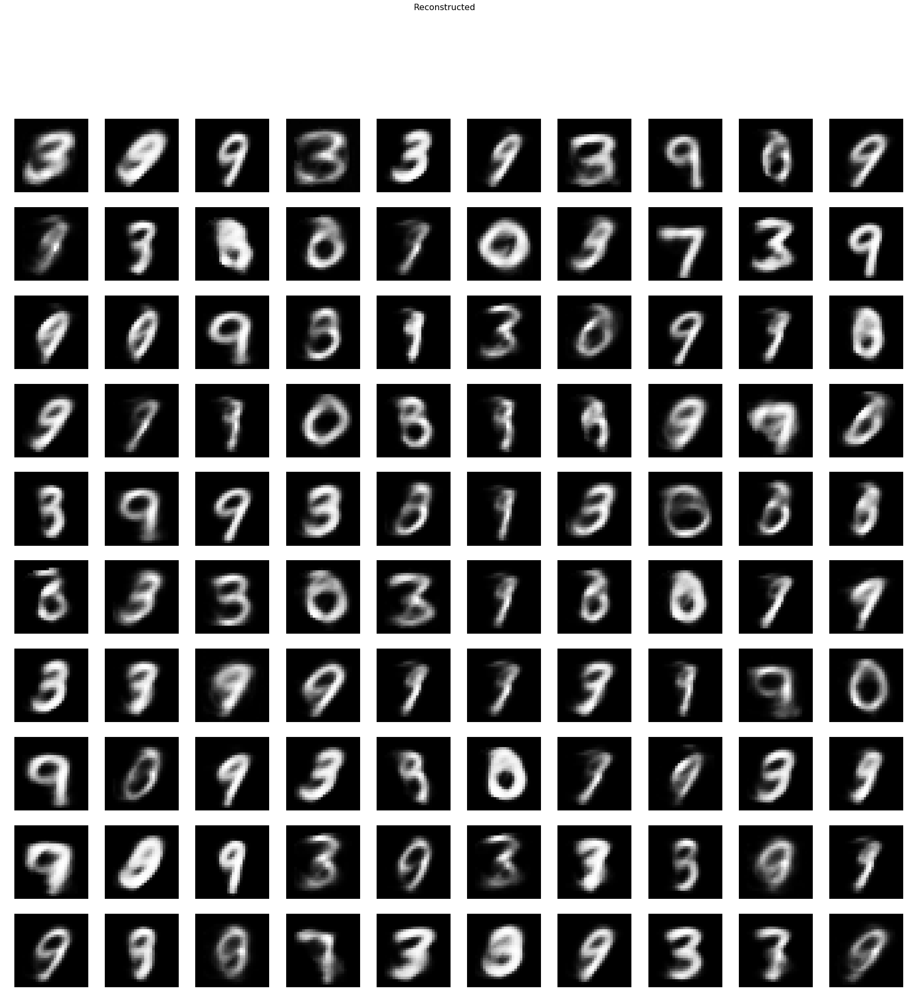

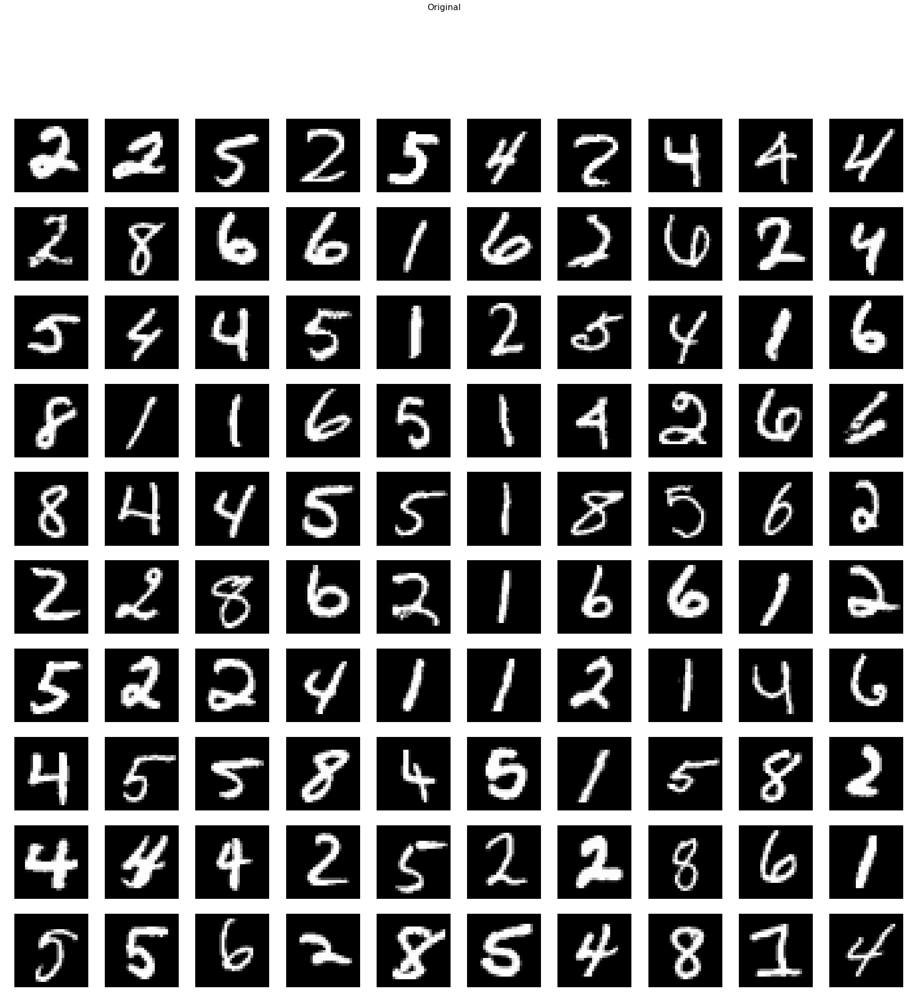

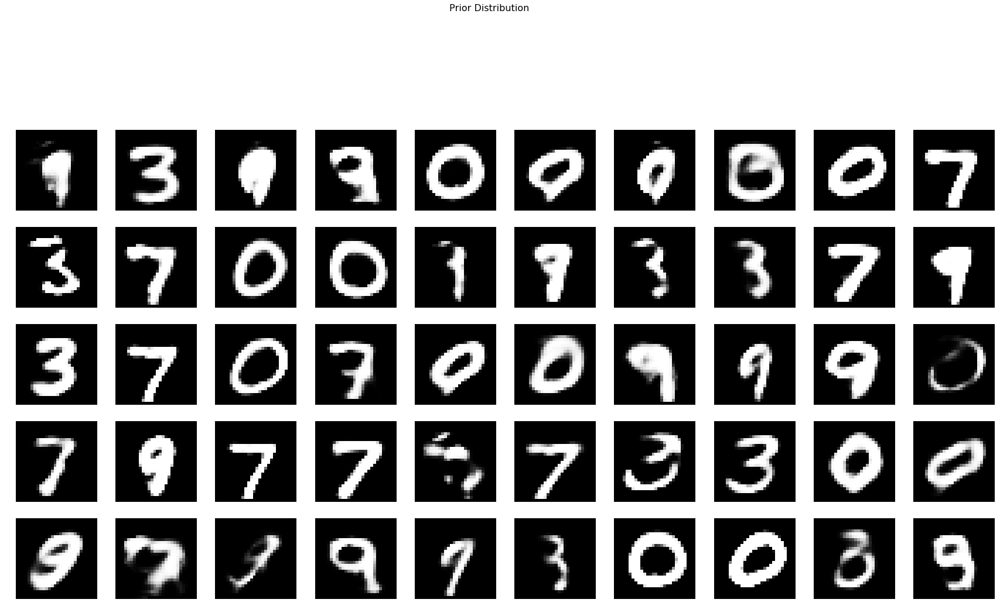

In [16]:
fig=plt.figure(figsize=(30,30))
fig1=plt.figure(figsize=(30,30))
fig2=plt.figure(figsize=(30,30))
idx=np.random.randint(0,unknown_test.shape[0],100)
test_images=unknown_test[idx]
output_imgs=AutoEncoder.predict(test_images)
test_loss=AutoEncoder.evaluate(test_images,output_imgs)
output_imgs=output_imgs.reshape(output_imgs.shape[0],28,28)
test_images=test_images.reshape(test_images.shape[0],28,28)
half_batch=50
latent_real= 5*np.random.normal(size=(half_batch, encoded_dim))
reco_img=decoder.predict(latent_real)
reco_img=reco_img.reshape(reco_img.shape[0],28,28)
fig.suptitle('Reconstructed',fontsize=16)
fig1.suptitle('Original',fontsize=16)
fig2.suptitle('Prior Distribution',fontsize=16)
for index, image in enumerate(output_imgs):
    #img = img.reshape((28, 28))
    ax=fig.add_subplot(10,10,index+1)
    ax.set_axis_off()
    ax.imshow(image, cmap="gray")
for index, image in enumerate(test_images):
    #img = img.reshape((28, 28))
    ax=fig1.add_subplot(10,10,index+1)
    ax.set_axis_off()
    ax.imshow(image, cmap="gray")
for index, image in enumerate(reco_img):
    #img = img.reshape((28, 28))
    ax=fig2.add_subplot(10,10,index+1)
    ax.set_axis_off()
    ax.imshow(image, cmap="gray")
plt.show()
plt.close(fig)
plt.close(fig1)
plt.close(fig2)

# Printing the Errors

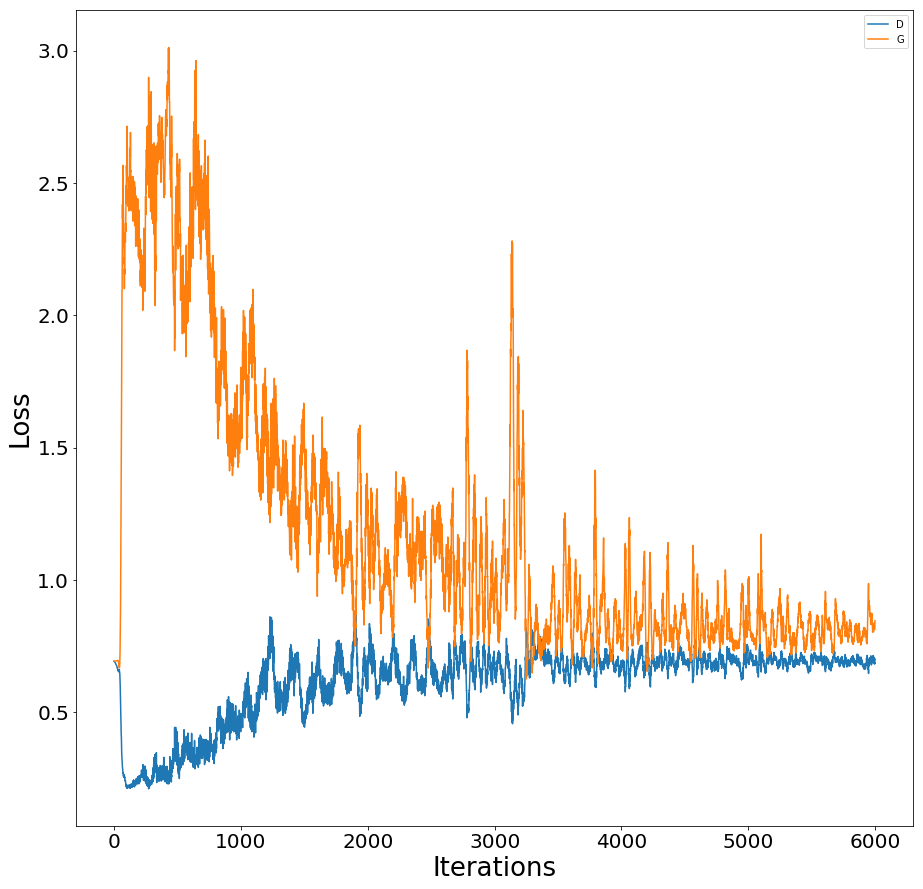

In [19]:
d_err=np.array(d_err)
g_e_err=np.array(g_e_err)
recons=np.array(recons)
plt.figure(figsize=(15,15))
fig.suptitle('Generator Discriminator Reconstruction Loss',fontsize=16)
plt.plot(d_err[:,0],label='D')
#plt.plot(recons[:,0],label='Recons')
plt.plot(g_e_err[:,0],label='G')
plt.xlabel('Iterations',fontsize=26)
plt.ylabel('Loss',fontsize=26)
plt.rc('xtick',labelsize=20)
plt.rc('ytick',labelsize=20)
plt.legend()
plt.show()

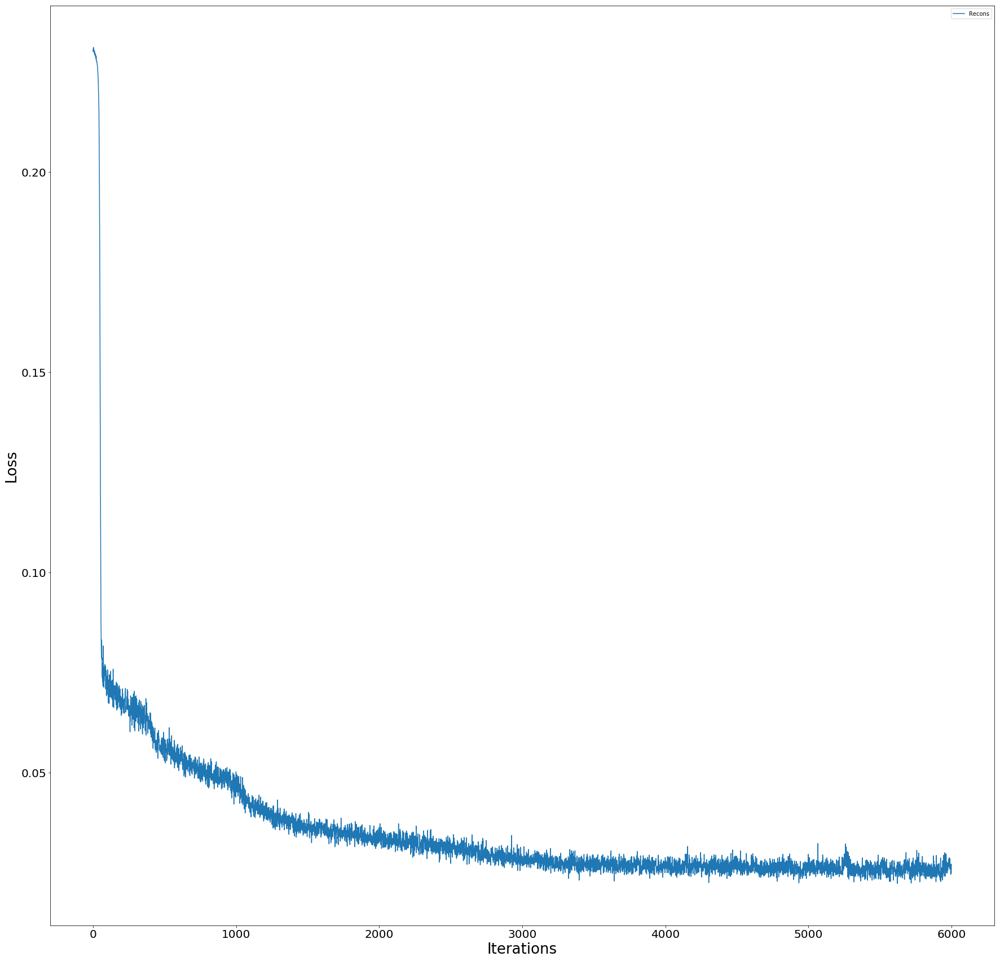

In [20]:
fig=plt.figure(figsize=(30,30))
plt.plot(recons[:,0],label='Recons')
plt.xlabel('Iterations',fontsize=26)
plt.ylabel('Loss',fontsize=26)
plt.legend()

# Calculation of Error per sample


In [74]:
train_error_kn=[]
train_derr_kn=[]
test_derr_kn=[]
test_error_kn=[]
test_error_unk=[]
test_error_per=dict()
train_error_per=dict()
train_derr_per=dict()
test_derr_per=dict()
for i in range(10):
    test_error_per[str(i)]=[]
    train_error_per[str(i)]=[]
    train_derr_per[str(i)]=[]
    test_derr_per[str(i)]=[]
for i in range(known_train.shape[0]):
    img=known_train[i].reshape(1,28,28,1)
    error,_=AutoEncoder.evaluate(img,img)
    encd=encoder.predict(img)
    derr,_=discriminator.evaluate(encd,[0])
    idx=known_train_labels[i]
    train_error_per[str(idx)].append(error)
    train_derr_per[str(idx)].append(derr)
    train_error_kn.append(error)
    train_derr_kn.append(derr)
for i in range(known_test.shape[0]):
    img=known_test[i].reshape(1,28,28,1)
    error,_=AutoEncoder.evaluate(img,img)
    idx=known_test_labels[i]
    encd=encoder.predict(img)
    derr,_=discriminator.evaluate(encd,[0])
    test_error_per[str(idx)].append(error)
    test_derr_per[str(idx)].append(derr)
    test_error_kn.append(error)
    test_derr_kn.append(derr)
for i in range(unknown_train_labels.shape[0]):
    idx=unknown_train_labels[i]
    img=unknown_train[i].reshape(1,28,28,1)
    error,_=AutoEncoder.evaluate(img,img)
    encd=encoder.predict(img)
    derr=discriminator.evaluate(encd,[0])
    test_error_per[str(idx)].append(error)
    test_error_unk.append(error)
    test_derr_per[str(idx)].append(derr)
for i in range(unknown_test_labels.shape[0]):
    img=unknown_test[i].reshape(1,28,28,1)
    idx=unknown_test_labels[i]
    error=AutoEncoder.evaluate(img,img)
    encd=encoder.predict(img)
    derr=discriminator.evaluate(encd,[0])
    test_error_per[str(idx)].append(error)
    test_error_unk.append(error)
    test_derr_per[str(idx)].append(derr)

1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 995us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 993us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 979us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 992us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 1000us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 995us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 994us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 1000us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 999us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 995us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 994us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 996us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 997us/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 998us/step


1/1 [==============================] - 0s 998us/step


In [109]:
#Loading the Saved Errors

file=open("Known"+str(kno)+"train_error_kn.txt","w")
for error in train_error_kn:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"train_derr_kn.txt","w")
for error in train_derr_kn:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"test_derr_kn.txt","w")
for error in test_derr_kn:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"test_error_kn.txt","w")
for error in test_error_kn:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"test_error_unk.txt","w")
for error in test_error_unk:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"d_err.txt","w")
for error in d_err:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"g_e_err.txt","w")
for error in g_e_err:
    file.write(str(error)+" ")
file.close()
file=open("Known"+str(kno)+"recons.txt","w")
for error in recons:
    file.write(str(error)+" ")
file.close()
np.save("Known"+str(kno)+"test_error_per.npy",test_error_per)
np.save("Known"+str(kno)+"train_error_per.npy",train_error_per)
np.save("Known"+str(kno)+"train_derr_per.npy",train_derr_per)
np.save("Known"+str(kno)+"test_derr_per.npy",test_derr_per)



